In [1]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="oGoCvjxBuj08jQSCGrDi")
project = rf.workspace("tp2-xvt9v").project("traffic-violation-detection-nmp13")
version = project.version(4)
dataset = version.download("yolov11")
                

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 110.9 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.10.0 requires tensorflow==2.17.0, but you have tensorflow 2.17.1 which is incompatible.
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Traffic-Violation-Detection-4 in yolov11:: 100%|██████████| 11898/11898 [00:01<00:00, 7675.83it/s]


In [2]:
!pip install python-decouple

In [3]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 994.0/994.0 kB 42.2 MB/s eta 0:00:00


In [12]:
pip install fpdf

  Preparing metadata (setup.py) ... done
  Created wheel for fpdf: filename=fpdf-1.7.2-py2.py3-none-any.whl size=40704 sha256=8af7aa3318c5968788da74b5f6063f87282f103b7f80a583fec4025596e08551
  Stored in directory: /root/.cache/pip/wheels/f9/95/ba/f418094659025eb9611f17cbcaf2334236bf39a0c3453ea455
Successfully built fpdf
Note: you may need to restart the kernel to use updated packages.


In [13]:
import os
import cv2
import json
import torch
import requests
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
from tqdm import tqdm
from datetime import datetime, timezone, timedelta
from roboflow import Roboflow
from decouple import config
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import LSTM, Dense
from fpdf import FPDF

In [5]:
from ultralytics import YOLO

# Load model
model = YOLO('yolo12n.pt') 

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.34M/5.34M [00:00<00:00, 371MB/s]


In [6]:
dataset_path = dataset.location  # e.g., './your-dataset'
model.train(data=os.path.join(dataset_path, '/kaggle/working/Traffic-Violation-Detection-4/data.yaml'), epochs=15, imgsz=640)

Ultralytics 8.3.105 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolo12n.pt, data=/kaggle/working/Traffic-Violation-Detection-4/data.yaml, epochs=15, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sho

100%|██████████| 755k/755k [00:00<00:00, 99.8MB/s]


Overriding model.yaml nc=80 with nc=9

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  2    180864  ultralytics.nn.modules.block.A2C2f           [128, 128, 2, True, 4]        
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 441MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/Traffic-Violation-Detection-4/train/labels... 4457 images, 64 backgrounds, 0 corrupt: 100%|██████████| 4457/4457 [00:03<00:00, 1221.44it/s]


train: New cache created: /kaggle/working/Traffic-Violation-Detection-4/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
val: Scanning /kaggle/working/Traffic-Violation-Detection-4/valid/labels... 892 images, 10 backgrounds, 0 corrupt: 100%|██████████| 892/892 [00:01<00:00, 842.98it/s]

val: New cache created: /kaggle/working/Traffic-Violation-Detection-4/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000769, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.0005), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15      3.46G      2.392      4.759      1.092         32        640: 100%|██████████| 279/279 [01:27<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:05<00:00,  4.72it/s]


                   all        892       1630      0.951     0.0578     0.0668     0.0263

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15      3.47G      2.148      2.841      1.034         24        640: 100%|██████████| 279/279 [01:23<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:04<00:00,  6.27it/s]

                   all        892       1630      0.306      0.104     0.0915     0.0374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15      3.47G      2.117      2.218      1.031         32        640: 100%|██████████| 279/279 [01:22<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:04<00:00,  6.21it/s]

                   all        892       1630       0.44      0.124       0.12     0.0474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15      3.47G      2.093      1.913      1.026         21        640: 100%|██████████| 279/279 [01:22<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:04<00:00,  6.15it/s]

                   all        892       1630      0.558      0.147      0.131      0.051



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15      3.47G      2.025      1.721      1.016         39        640: 100%|██████████| 279/279 [01:22<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:04<00:00,  6.40it/s]

                   all        892       1630      0.715       0.16      0.159     0.0636


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15      3.47G      1.961      1.618      1.031         23        640: 100%|██████████| 279/279 [01:22<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:04<00:00,  6.16it/s]

                   all        892       1630      0.662      0.162      0.163     0.0647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15      3.47G      1.941       1.49      1.028         15        640: 100%|██████████| 279/279 [01:22<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:04<00:00,  6.13it/s]

                   all        892       1630      0.719      0.195      0.198     0.0781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15      3.47G      1.906      1.419      1.023         16        640: 100%|██████████| 279/279 [01:21<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:04<00:00,  6.36it/s]

                   all        892       1630      0.648      0.227       0.21     0.0921



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15      3.47G      1.883      1.357      1.007         21        640: 100%|██████████| 279/279 [01:22<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:04<00:00,  6.37it/s]

                   all        892       1630      0.562      0.209      0.229      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/15      3.47G      1.857      1.287      1.005         13        640: 100%|██████████| 279/279 [01:21<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:04<00:00,  6.35it/s]

                   all        892       1630      0.566      0.234       0.27      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15      3.47G      1.821       1.24     0.9977         16        640: 100%|██████████| 279/279 [01:22<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:04<00:00,  6.18it/s]

                   all        892       1630       0.71      0.214      0.297      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15      3.47G      1.816      1.196     0.9935         16        640: 100%|██████████| 279/279 [01:22<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:04<00:00,  6.37it/s]

                   all        892       1630      0.565      0.256      0.261      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15      3.47G      1.789      1.164     0.9922         17        640: 100%|██████████| 279/279 [01:21<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:04<00:00,  6.21it/s]

                   all        892       1630       0.59      0.234      0.302      0.135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/15      3.47G      1.756      1.118     0.9808         19        640: 100%|██████████| 279/279 [01:22<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:04<00:00,  6.30it/s]

                   all        892       1630      0.596      0.266      0.308      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15      3.47G      1.734       1.08      0.972         15        640: 100%|██████████| 279/279 [01:22<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:04<00:00,  6.32it/s]

                   all        892       1630      0.582      0.273      0.325       0.15



15 epochs completed in 0.367 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.105 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv12n summary (fused): 159 layers, 2,558,483 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:05<00:00,  5.09it/s]


                   all        892       1630      0.583      0.274      0.325       0.15
        0 - motorcycle        740       1208      0.739      0.838      0.854      0.413
1 - motorcycle - pedestrian road          4          4          1          0    0.00117   0.000821
13 - bicycle - stop line          1          1          0          0          0          0
14 - bicycle - crosswalk         29         29      0.224      0.172      0.191     0.0865
3 - motorcycle - jaywalk          6          6          1          0     0.0226    0.00922
5 - motorcycle - stop line        134        165      0.571      0.752      0.706      0.322
6 - motorcycle - crosswalk        155        180      0.586      0.633      0.588      0.269
           7 - bicycle         27         28      0.122     0.0714     0.0785     0.0338
9 - bicycle - pedestrian road          9          9          1          0      0.488      0.218


invalid value encountered in less
invalid value encountered in less


Speed: 0.1ms preprocess, 1.7ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e9f50fdd510>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0470

In [7]:
model.save("yolo_violation_detector.pt")

In [8]:
input_folder = "/kaggle/working/Traffic-Violation-Detection-4/test/images"  # Folder with images to test
output_folder = "output_violations"
os.makedirs(output_folder, exist_ok=True)


In [9]:
for image_name in tqdm(os.listdir(input_folder)):
    if image_name.endswith(('.jpg', '.png')):
        img_path = os.path.join(input_folder, image_name)
        results = model(img_path)

        # Save with bounding boxes
        results[0].save(filename=os.path.join(output_folder, image_name))

# --- 5. Extract YOLO Predictions for LSTM Input ---
sequence_data = []
labels = []  # 1 = violation, 0 = normal


  0%|          | 0/594 [00:00<?, ?it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0960_jpg.rf.854e7eb3b6c07bb412ed55b98d388086.jpg: 384x640 1 0 - motorcycle, 46.7ms
Speed: 1.1ms preprocess, 46.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


  0%|          | 1/594 [00:00<02:17,  4.30it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0502_jpg.rf.37fbe64654b4b8169e4ef7f1ec7bdc11.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 1.2ms preprocess, 12.0ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0002_jpg.rf.d5638ea96546d840c5ed15ce7c76d34c.jpg: 384x640 1 5 - motorcycle - stop line, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0279_jpg.rf.2a5252b691a20600c797228ad2e34526.jpg: 384x640 2 0 - motorcycles, 13.1ms
Speed: 0.9ms preprocess, 13.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0020_jpg.rf.7807e9643145b95a23d6dbec088d48d8.jpg: 384x640 2 0 - motorcycles, 12.5ms
Speed: 

  1%|          | 6/594 [00:00<00:27, 21.08it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0213_jpg.rf.21721ee99db2464b62b764772533beb0.jpg: 384x640 2 0 - motorcycles, 11.8ms
Speed: 0.9ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0060_jpg.rf.f0e6b0a57ea51d9b77ca114a7f062a14.jpg: 384x640 3 0 - motorcycles, 11.8ms
Speed: 0.9ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0418_jpg.rf.672ea565dc1aae5c2a4c432744bd88e8.jpg: 384x640 3 5 - motorcycle - stop lines, 11.5ms
Speed: 0.8ms preprocess, 11.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0445_jpg.rf.6d29235fb36d09a1b74e8f9c17536470.jpg: 384x640 (no detections), 11.9ms
Speed:

  2%|▏         | 11/594 [00:00<00:18, 30.77it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0982_jpg.rf.293e99391af5863c54ef4a23fd9d4eb4.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0545_jpg.rf.597abfbe163aac3b8bc0876a43502f29.jpg: 384x640 1 0 - motorcycle, 11.8ms
Speed: 0.9ms preprocess, 11.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0057_jpg.rf.5bd366d28d69582689c1b6783627570d.jpg: 384x640 3 0 - motorcycles, 11.9ms
Speed: 0.9ms preprocess, 11.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0935_jpg.rf.60e2d9327305b710a66d79fb18593b57.jpg: 384x640 1 0 - motorcycle, 11.8ms
Speed: 0.8ms preproc

  3%|▎         | 16/594 [00:00<00:15, 36.34it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0445_jpg.rf.fb0b9854a685370600d2b4f2af38f396.jpg: 384x640 2 0 - motorcycles, 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0376_jpg.rf.5ad10dec41df8eda748631e75368bdc2.jpg: 384x640 1 0 - motorcycle, 12.3ms
Speed: 0.9ms preprocess, 12.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0064_jpg.rf.ed7ed98a3f05b8b7fd6e141dcbcd69b4.jpg: 384x640 1 0 - motorcycle, 11.8ms
Speed: 0.9ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-4-_20230830_101212_0599_jpg.rf.6d4ec53864213ec3df866c2c564a0a60.jpg: 384x640 1 0 - motorcycle, 11.9ms
Speed: 0.9ms prep

  4%|▎         | 21/594 [00:00<00:14, 40.04it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0650_jpg.rf.0986cbbfbab4b20f93e3556a8f197de6.jpg: 384x640 1 0 - motorcycle, 1 5 - motorcycle - stop line, 1 6 - motorcycle - crosswalk, 11.8ms
Speed: 0.8ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0611_jpg.rf.b7e43eaa01d9aaac46b30283bfa2b2c2.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.8ms preprocess, 12.1ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0003_jpg.rf.4f0f5e605bec51bdf8b5128147117503.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0978_jpg.rf.cebf54d1cbe79c2b6f86a3cf633b131e

  4%|▍         | 26/594 [00:00<00:13, 42.41it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_1214_jpg.rf.04567a7390de457d095cc4b3d9a5f030.jpg: 384x640 1 0 - motorcycle, 11.9ms
Speed: 0.9ms preprocess, 11.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0675_jpg.rf.719c23c0cc114d6d6f8f8c049e3782f2.jpg: 384x640 1 6 - motorcycle - crosswalk, 11.9ms
Speed: 0.8ms preprocess, 11.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230830_101212_1088_jpg.rf.1f307e0044d2af83efc386c243f9c21a.jpg: 384x640 1 0 - motorcycle, 11.9ms
Speed: 0.9ms preprocess, 11.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1143_jpg.rf.d1126f504a1f1bb15dc85a89abe596fb.jpg: 384x640 1 0 - motorcycle, 11.8ms
Speed: 

  5%|▌         | 31/594 [00:00<00:12, 44.32it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230830_101212_0814_jpg.rf.8af7aa48495ef3c246167ab63e7d8cde.jpg: 384x640 1 0 - motorcycle, 11.8ms
Speed: 0.9ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0402_jpg.rf.3fdde6d767e6b642c339deb1d22d5e75.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.8ms preprocess, 12.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0626_jpg.rf.ca99a5519be0896053e6319f1e33054b.jpg: 384x640 (no detections), 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0722_jpg.rf.319ad524fe8763e02a2eed2d3fb9d35f.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.9ms preproc

  6%|▌         | 36/594 [00:00<00:12, 45.70it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_1019_jpg.rf.3c561380aef554b993ab28d3d6b7737c.jpg: 384x640 2 0 - motorcycles, 12.3ms
Speed: 0.9ms preprocess, 12.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0501_jpg.rf.841ea794f43f87d7238cafd8d1cee16b.jpg: 384x640 3 0 - motorcycles, 11.7ms
Speed: 0.8ms preprocess, 11.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0227_jpg.rf.adb7d8f1f512de584f95f2a7eb88ef37.jpg: 384x640 1 5 - motorcycle - stop line, 12.2ms
Speed: 0.8ms preprocess, 12.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0425_jpg.rf.c58894a3831c80be2ce350f6ed7899f8.jpg: 384x640 2 0 - motorcycles, 11.7ms
Speed

  7%|▋         | 41/594 [00:01<00:11, 46.27it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0667_jpg.rf.bf1a17514c39833a755b0f34c7848226.jpg: 384x640 1 0 - motorcycle, 11.5ms
Speed: 0.8ms preprocess, 11.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230830_101212_1175_jpg.rf.a366d19dae4f2b7ef962561312987e48.jpg: 384x640 2 0 - motorcycles, 11.5ms
Speed: 0.8ms preprocess, 11.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0608_jpg.rf.3d933a71eb2cb2b9178865484864b327.jpg: 384x640 1 5 - motorcycle - stop line, 11.4ms
Speed: 0.8ms preprocess, 11.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0797_jpg.rf.7b25cdd3b7bce42baeaef43ae843cfc7.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed:

  8%|▊         | 46/594 [00:01<00:11, 47.09it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0048_jpg.rf.df3734a855d2e0a7631a8b903fbc04e4.jpg: 384x640 1 6 - motorcycle - crosswalk, 11.7ms
Speed: 0.9ms preprocess, 11.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0728_jpg.rf.f6e83b30b1b2a66c1bcca0ea51cb8d63.jpg: 384x640 (no detections), 11.9ms
Speed: 0.8ms preprocess, 11.9ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0989_jpg.rf.5d2a487475a7ff08b30f79d359065991.jpg: 384x640 (no detections), 11.8ms
Speed: 0.8ms preprocess, 11.8ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1008_jpg.rf.28a09505ad422dd9e099b5da1c6ce2e2.jpg: 384x640 2 0 - motorcycles, 11.9ms
Speed: 0.8

  9%|▉         | 52/594 [00:01<00:11, 48.01it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0028_jpg.rf.8a992565678ddf71f0804614feb296df.jpg: 384x640 1 0 - motorcycle, 1 5 - motorcycle - stop line, 11.7ms
Speed: 0.8ms preprocess, 11.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0546_jpg.rf.230ca884c0f774d4b0cf20e57a75e4e9.jpg: 384x640 (no detections), 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230829_222433_0551_jpg.rf.d42504b0deb86c4e6cada7b5e320ffd8.jpg: 384x640 1 0 - motorcycle, 12.3ms
Speed: 0.8ms preprocess, 12.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0061_jpg.rf.471580111d87e825a2c9ee7fd07d5ef1.jpg: 384x640 1 0 - motorcyc

 10%|▉         | 57/594 [00:01<00:11, 48.04it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0660_jpg.rf.9d854a5cd9315c066fdca13ca41081d5.jpg: 384x640 2 0 - motorcycles, 12.5ms
Speed: 0.9ms preprocess, 12.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0675_jpg.rf.30569d5173626a6d72b8e2dc59a322d1.jpg: 384x640 (no detections), 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0567_jpg.rf.41c7f6754ef2cf34f8127ba5a6316032.jpg: 384x640 2 0 - motorcycles, 12.6ms
Speed: 0.9ms preprocess, 12.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230830_101212_0493_jpg.rf.391886ad00b59d2fc8daa4d9af0bfe63.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.9ms prepr

 10%|█         | 62/594 [00:01<00:11, 47.99it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0244_jpg.rf.812a4be7113c24dd81b1c2f9fa94f13c.jpg: 384x640 1 0 - motorcycle, 1 5 - motorcycle - stop line, 12.5ms
Speed: 0.9ms preprocess, 12.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230830_101212_1132_jpg.rf.99dc863f53dfa663b66e37339d56cd5d.jpg: 384x640 1 0 - motorcycle, 12.4ms
Speed: 0.9ms preprocess, 12.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0395_jpg.rf.864a65e99ad4e52c15596cf38bc2cff3.jpg: 384x640 1 0 - motorcycle, 11.9ms
Speed: 0.9ms preprocess, 11.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-4-_20230830_101212_0993_jpg.rf.f1db4d19a5609da4ca0fccf7e0f77cb3.jpg: 384x640 1 0 - motorc

 11%|█▏        | 67/594 [00:01<00:11, 47.70it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0005_jpg.rf.912f1f290b1a421e6188b59e188dc79d.jpg: 384x640 (no detections), 12.3ms
Speed: 0.9ms preprocess, 12.3ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0005_jpg.rf.67f2e521f526f23799eaa10bf04a08a1.jpg: 384x640 1 5 - motorcycle - stop line, 11.8ms
Speed: 0.8ms preprocess, 11.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0399_jpg.rf.9cc26768ff2cf29e6baad5cfa091dfd8.jpg: 384x640 1 0 - motorcycle, 1 6 - motorcycle - crosswalk, 12.6ms
Speed: 0.8ms preprocess, 12.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1004_jpg.rf.494ff6da62846a7b08a48f8e77578ec2.jpg: 384x640 2 0 -

 12%|█▏        | 72/594 [00:01<00:10, 47.86it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0094_jpg.rf.3b99c374024e06b9f6572b080f9a017f.jpg: 384x640 3 0 - motorcycles, 13.9ms
Speed: 1.0ms preprocess, 13.9ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0959_jpg.rf.e33efe53cf1d76c2372e0d9e157aa02a.jpg: 384x640 1 0 - motorcycle, 13.0ms
Speed: 1.0ms preprocess, 13.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0149_jpg.rf.c7be28bc0eeec8213c8efd37db401c92.jpg: 384x640 1 0 - motorcycle, 12.6ms
Speed: 0.9ms preprocess, 12.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0255_jpg.rf.292224c8e7e87e26ed4a5d563da8923c.jpg: 384x640 2 0 - motorcycles, 12.3ms
Speed: 0.9ms prepr

 13%|█▎        | 77/594 [00:01<00:11, 46.89it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1045_jpg.rf.9670f8915510fd782c159e1a9e649919.jpg: 384x640 (no detections), 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0962_jpg.rf.4ad218573026e739c67edcc8a34ea41e.jpg: 384x640 1 5 - motorcycle - stop line, 1 6 - motorcycle - crosswalk, 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0393_jpg.rf.e1c6292e947590a427f5b0f2f4f825df.jpg: 384x640 2 0 - motorcycles, 11.7ms
Speed: 0.8ms preprocess, 11.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0149_jpg.rf.ec28cf2f4ea0a2db157c9488e83967c2.jpg: 384x640 2 0 

 14%|█▍        | 82/594 [00:01<00:10, 47.46it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0443_jpg.rf.289c9e6777bcee11fcae2e1dd43dcda5.jpg: 384x640 1 0 - motorcycle, 11.7ms
Speed: 0.8ms preprocess, 11.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0791_jpg.rf.52c3836e71b41c90e7ff40e43f58dd08.jpg: 384x640 (no detections), 12.8ms
Speed: 1.0ms preprocess, 12.8ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0686_jpg.rf.468a8c336515640ecd16a2ecc8d7b96e.jpg: 384x640 1 5 - motorcycle - stop line, 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0572_jpg.rf.c482e6f654ac6b76fdc9fb1c28844cef.jpg: 384x640 1 6 - motorcycle - crosswalk, 11.8m

 15%|█▍        | 87/594 [00:02<00:10, 47.25it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0420_jpg.rf.8d75bb4a5ea59394f871aa93b145c9ba.jpg: 384x640 (no detections), 14.4ms
Speed: 1.0ms preprocess, 14.4ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0856_jpg.rf.bc5fda5dea3bfc7184a4eaef84f5591d.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0945_jpg.rf.f4bf0537ae38bcf6d4cef39f4f3bd5a6.jpg: 384x640 2 0 - motorcycles, 11.8ms
Speed: 0.8ms preprocess, 11.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_1069_jpg.rf.217c27d7aca807f43898fa5fcaa2b3db.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.9ms preproce

 15%|█▌        | 92/594 [00:02<00:10, 47.02it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0406_jpg.rf.a7558d2c0c40c65dbf8ef9b7a652a774.jpg: 384x640 1 0 - motorcycle, 12.5ms
Speed: 0.9ms preprocess, 12.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0718_jpg.rf.081c61c46a033eef4a705168948d9fd5.jpg: 384x640 2 0 - motorcycles, 11.9ms
Speed: 0.9ms preprocess, 11.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0965_jpg.rf.a79a06e942f77d464e80498eb3743f19.jpg: 384x640 1 0 - motorcycle, 11.8ms
Speed: 0.8ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0510_jpg.rf.716f8c9d97ed805ba0940067a3b408a5.jpg: 384x640 1 0 - motorcycle, 1 5 - motorcycle - stop lin

 16%|█▋        | 97/594 [00:02<00:10, 47.26it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0528_jpg.rf.09dd94c8523cac9884bf435324940a1b.jpg: 384x640 1 0 - motorcycle, 12.6ms
Speed: 0.9ms preprocess, 12.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0043_jpg.rf.3e49f315d1588f799a8d33bb184dcf7f.jpg: 384x640 3 0 - motorcycles, 12.4ms
Speed: 0.9ms preprocess, 12.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1048_jpg.rf.56963f79d3646c6045d9de5ef5f80ed8.jpg: 384x640 1 0 - motorcycle, 13.5ms
Speed: 0.9ms preprocess, 13.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0316_jpg.rf.23da1310f7a69cf445b2dd5437280d50.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.8ms prepro

 17%|█▋        | 102/594 [00:02<00:10, 46.99it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0716_jpg.rf.09077ddabb0e60b749d84473b36fd7be.jpg: 384x640 1 0 - motorcycle, 1 5 - motorcycle - stop line, 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0770_jpg.rf.8f8ebacee5c77d6d3d3775a4c5e47932.jpg: 384x640 (no detections), 12.3ms
Speed: 0.8ms preprocess, 12.3ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0410_jpg.rf.254141fe3ef2ee84655ff3598530f657.jpg: 384x640 4 0 - motorcycles, 11.8ms
Speed: 0.8ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0416_jpg.rf.2a52dcbd8f2ecb8c5f9d29d8829d35a6.jpg: 384x640 2 0 - motorcycl

 18%|█▊        | 107/594 [00:02<00:10, 47.13it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0168_jpg.rf.d41e9ea1995e500b224b58d7e898356f.jpg: 384x640 4 0 - motorcycles, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0514_jpg.rf.ac3facb9334aba76eefc3fbd71836500.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0397_jpg.rf.dceac80c2e78388992861b09fb2de57a.jpg: 384x640 2 0 - motorcycles, 12.4ms
Speed: 0.9ms preprocess, 12.4ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0829_jpg.rf.043773c67fc125c14b223f14853a386e.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.9ms prepro

 19%|█▉        | 112/594 [00:02<00:10, 47.17it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1001_jpg.rf.7662df40865013693f27cddd55c1f350.jpg: 384x640 1 0 - motorcycle, 12.7ms
Speed: 0.9ms preprocess, 12.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0761_jpg.rf.dc49d64b2fe968b5811bef05efbc3dd1.jpg: 384x640 (no detections), 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0273_jpg.rf.9a99a7329e4719faa36f8e4210821845.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0269_jpg.rf.54fbe5e086f54e9202d74cfcf4a44461.jpg: 384x640 1 6 - motorcycle - crosswalk, 11.9ms
Speed: 0.8

 20%|█▉        | 117/594 [00:02<00:10, 47.34it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0308_jpg.rf.cccf346e9569d2c19bbc0023348fb935.jpg: 384x640 (no detections), 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0484_jpg.rf.e641b5c901be0bac25c5a0a1d0ff4bfb.jpg: 384x640 2 0 - motorcycles, 1 5 - motorcycle - stop line, 12.3ms
Speed: 0.9ms preprocess, 12.3ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1053_jpg.rf.449e811460c1cca6da720374062f3a7a.jpg: 384x640 1 0 - motorcycle, 12.4ms
Speed: 0.9ms preprocess, 12.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0097_jpg.rf.6d285cfbd92cdb6f4dd19d9b6b609bcc.jpg: 384x640 2 0 - motorcycle

 21%|██        | 122/594 [00:02<00:09, 47.26it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0097_jpg.rf.2666331378c280f4c2a54e5f9ae10285.jpg: 384x640 1 0 - motorcycle, 11.7ms
Speed: 0.9ms preprocess, 11.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0672_jpg.rf.2f1c5c34f086aa838d4a501c0cc6786b.jpg: 384x640 1 0 - motorcycle, 12.2ms
Speed: 0.8ms preprocess, 12.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0212_jpg.rf.608d7b1d2e1066fd101680094d5ebddf.jpg: 384x640 3 0 - motorcycles, 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0118_jpg.rf.a8abc55dce6f1f122266944d564c5fc8.jpg: 384x640 2 0 - motorcycles, 11.9ms
Speed: 0.8ms prepro

 21%|██▏       | 127/594 [00:02<00:09, 47.36it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1160_jpg.rf.dd9f2a0d5322f70a8be3ce9ef404f8d8.jpg: 384x640 2 0 - motorcycles, 12.3ms
Speed: 0.9ms preprocess, 12.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0346_jpg.rf.279537732ae2dc10bb2ef835ff78d02b.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0685_jpg.rf.8d6d381aa802e5d9b9293995611ec8bd.jpg: 384x640 1 0 - motorcycle, 1 5 - motorcycle - stop line, 12.6ms
Speed: 0.9ms preprocess, 12.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0589_jpg.rf.999c87864437b3247c513c4a809b6b76.jpg: 384x640 (no detections)

 22%|██▏       | 132/594 [00:02<00:09, 47.29it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0456_jpg.rf.6de68fcdea81650aaab135f91a3b7609.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0351_jpg.rf.50d7acbe6102f543698d2cc5f121b55a.jpg: 384x640 2 0 - motorcycles, 12.1ms
Speed: 0.8ms preprocess, 12.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_1112_jpg.rf.fa24c67dc58f041d5cccc4c9f8527b83.jpg: 384x640 1 0 - motorcycle, 11.8ms
Speed: 0.8ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0516_jpg.rf.40559285438975afbdf9ae086a2398ce.jpg: 384x640 (no detections), 12.4ms
Speed: 0.8ms preproc

 23%|██▎       | 137/594 [00:03<00:09, 47.56it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0406_jpg.rf.f8da1e6fd2431314c29292afac2a5ca3.jpg: 384x640 2 0 - motorcycles, 1 5 - motorcycle - stop line, 11.9ms
Speed: 0.8ms preprocess, 11.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0227_jpg.rf.a13343d9f4e59c4af1fe6e61b5ae1166.jpg: 384x640 4 0 - motorcycles, 12.1ms
Speed: 0.8ms preprocess, 12.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0168_jpg.rf.8a9af2faf59100839db2e025e833bf11.jpg: 384x640 2 0 - motorcycles, 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0393_jpg.rf.c87cdbccf0b32cdbfca39f34c136e27a.jpg: 384x640 1 0 - motorc

 24%|██▍       | 142/594 [00:03<00:09, 47.52it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0083_jpg.rf.631bce94c2269ebc1fd8bfdf2396df40.jpg: 384x640 1 0 - motorcycle, 12.5ms
Speed: 0.8ms preprocess, 12.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0845_jpg.rf.bf0ec011115955de1cd3bf3a17fcb080.jpg: 384x640 (no detections), 12.5ms
Speed: 0.9ms preprocess, 12.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0512_jpg.rf.5555f4002546abbe26b152151ed07863.jpg: 384x640 1 6 - motorcycle - crosswalk, 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_1209_jpg.rf.544fdc7813579f56770547d07a932f36.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.8

 25%|██▍       | 147/594 [00:03<00:09, 47.58it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-4-_20230830_101212_0678_jpg.rf.e631deaba5c225de87f64272fe74dbc4.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1219_jpg.rf.cf26f7576a31ba08c6aa5259cfcf12a5.jpg: 384x640 1 0 - motorcycle, 12.3ms
Speed: 0.9ms preprocess, 12.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1044_jpg.rf.839b20a0edeebf734b143348d4f9ae9d.jpg: 384x640 2 0 - motorcycles, 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0721_jpg.rf.64d02efccc5a985a79f49ce858d13ccf.jpg: 384x640 3 0 - motorcycles, 1 5 - motorcycle - stop 

 26%|██▌       | 152/594 [00:03<00:09, 47.61it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0047_jpg.rf.994ba6102ac2f58c159b308372f5ae39.jpg: 384x640 1 0 - motorcycle, 2 5 - motorcycle - stop lines, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0659_jpg.rf.fd9ad114771a482194cc8f4fa771aa28.jpg: 384x640 1 0 - motorcycle, 11.8ms
Speed: 0.9ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0245_jpg.rf.89adc216261148f2cd7385f74297ce6b.jpg: 384x640 1 0 - motorcycle, 11.9ms
Speed: 0.8ms preprocess, 11.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0208_jpg.rf.674a57400c42fbf4fd0948a8ed567e2b.jpg: 384x640 1 0 - motorcycl

 26%|██▋       | 157/594 [00:03<00:09, 47.81it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1194_jpg.rf.ea5ed217d98de65fa19d8eb9f1db6150.jpg: 384x640 3 0 - motorcycles, 1 14 - bicycle - crosswalk, 1 5 - motorcycle - stop line, 11.8ms
Speed: 0.9ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0772_jpg.rf.4db26cb095e69aaea9f52d1aa8c3d8ef.jpg: 384x640 1 0 - motorcycle, 13.3ms
Speed: 0.9ms preprocess, 13.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0980_jpg.rf.d44d70bab546833eb9be786cd65b1672.jpg: 384x640 4 0 - motorcycles, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0097_jpg.rf.9c8b8475ab9d37322c0058b2c5ddaed5

 27%|██▋       | 162/594 [00:03<00:09, 47.47it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_1013_jpg.rf.c00680ec6076e3321e28bb5a4fd273c7.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.8ms preprocess, 12.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0933_jpg.rf.da3963cd9f700c112b4885b24488645f.jpg: 384x640 1 0 - motorcycle, 11.8ms
Speed: 0.8ms preprocess, 11.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0741_jpg.rf.3855d0183d2285266ce673b4b4d53087.jpg: 384x640 2 5 - motorcycle - stop lines, 12.8ms
Speed: 0.9ms preprocess, 12.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1024_jpg.rf.9454a82e35e1b7378137faae98f715a3.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0

 28%|██▊       | 167/594 [00:03<00:09, 47.42it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0052_jpg.rf.27ba0f018fd629415e5dc7859c24dce5.jpg: 384x640 1 6 - motorcycle - crosswalk, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0828_jpg.rf.ade7be7d9f2ec04bc94f6a7ff853475b.jpg: 384x640 1 6 - motorcycle - crosswalk, 12.5ms
Speed: 0.9ms preprocess, 12.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0255_jpg.rf.f4bca36298f3c830716f18b4c53c226d.jpg: 384x640 2 0 - motorcycles, 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0996_jpg.rf.5e2247a8fab9e71d95fb7e0331d70e0b.jpg: 384x640 1 0 - motorcycle, 12.

 29%|██▉       | 172/594 [00:03<00:08, 47.56it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0489_jpg.rf.754bcc778a3b35a00f51884d7b59d809.jpg: 384x640 1 0 - motorcycle, 1 6 - motorcycle - crosswalk, 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_1205_jpg.rf.17cf36ae5b2da5b5c4ec433d40702ed0.jpg: 384x640 (no detections), 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0322_jpg.rf.f776098e9822fd064371b9bdbedd2da9.jpg: 384x640 2 0 - motorcycles, 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0255_jpg.rf.ecb1fb51f6a2bfbca53ffc9d636fae50.jpg: 384x640 1 5 - motorcycl

 30%|██▉       | 177/594 [00:03<00:08, 47.59it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0398_jpg.rf.c0040eef41d78c0652dc5f269a636069.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.8ms preprocess, 12.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0910_jpg.rf.61b09f729bad6f231ea88a95278fd0a9.jpg: 384x640 1 0 - motorcycle, 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0632_jpg.rf.c6407592f01010a99e443015264b940d.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0264_jpg.rf.29b8eeaa8ea18f5c9ffcccf353f03875.jpg: 384x640 2 0 - motorcycles, 11.8ms
Speed: 0.9ms prepro

 31%|███       | 182/594 [00:04<00:08, 47.72it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0279_jpg.rf.1f9b0ad7a49acf4b277126d276222752.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0846_jpg.rf.0fbda5017bad9d2c1cef13fd470d1b43.jpg: 384x640 1 0 - motorcycle, 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0635_jpg.rf.4967f21a144450bdd409653c0855a4c3.jpg: 384x640 3 0 - motorcycles, 2 6 - motorcycle - crosswalks, 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0052_jpg.rf.754b3f82a5e916d07417380d3afbb21d.jpg: 384x640 2 0 - motorcyc

 31%|███▏      | 187/594 [00:04<00:08, 47.63it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0708_jpg.rf.018ab3856fa18fc7498db79368933cfb.jpg: 384x640 (no detections), 12.2ms
Speed: 0.8ms preprocess, 12.2ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0705_jpg.rf.32f8b4c9de0bd6c1541faf612251d84e.jpg: 384x640 1 6 - motorcycle - crosswalk, 12.1ms
Speed: 0.8ms preprocess, 12.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0240_jpg.rf.2e4f83ea25b1f9c6de23c57f3b8d5261.jpg: 384x640 1 6 - motorcycle - crosswalk, 11.7ms
Speed: 0.8ms preprocess, 11.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0505_jpg.rf.1c50d8b78e187a735a01bab06707d42e.jpg: 384x640 1 0 - motorcycle, 12.0m

 32%|███▏      | 192/594 [00:04<00:08, 47.75it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0131_jpg.rf.f3ef3c820d48ab257ae1fe752baf1ada.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0440_jpg.rf.0de24eda308471703e7b549024af7bfc.jpg: 384x640 (no detections), 12.5ms
Speed: 0.8ms preprocess, 12.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0240_jpg.rf.b1bb24f7fddeb056f921c4f2fa30740b.jpg: 384x640 1 0 - motorcycle, 13.7ms
Speed: 0.8ms preprocess, 13.7ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0144_jpg.rf.4d13f56892db625a64e2b67ab60fb43a.jpg: 384x640 1 0 - motorcycle, 12.3ms
Speed: 0.9ms preproces

 33%|███▎      | 197/594 [00:04<00:08, 47.42it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0794_jpg.rf.a3a22e1a803c7ab996e4c43fb9b592a1.jpg: 384x640 2 0 - motorcycles, 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0329_jpg.rf.092741e60037dbcd03c0da9b81fc89d5.jpg: 384x640 1 0 - motorcycle, 12.3ms
Speed: 0.9ms preprocess, 12.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0323_jpg.rf.c387c5da54b9cfb34cbe2bd2ebe6ae48.jpg: 384x640 1 6 - motorcycle - crosswalk, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0008_jpg.rf.ade3ad42eac729f2d20de685788b6387.jpg: 384x640 3 0 - motorcycles, 1 5 - motorcyc

 34%|███▍      | 202/594 [00:04<00:08, 47.45it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0982_jpg.rf.5f8f16a4cc2d451cdcb94f13b06a7326.jpg: 384x640 (no detections), 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0506_jpg.rf.61525bb6d9479414bc08f2b9b650599d.jpg: 384x640 2 0 - motorcycles, 12.3ms
Speed: 0.9ms preprocess, 12.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0732_jpg.rf.14099796a34afd52845e1bee631a645d.jpg: 384x640 2 0 - motorcycles, 12.5ms
Speed: 0.9ms preprocess, 12.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0337_jpg.rf.6782da33238c8762621749d2c1ad274e.jpg: 384x640 3 0 - motorcycles, 12.3ms
Speed: 0.9ms prepr

 35%|███▍      | 207/594 [00:04<00:08, 47.32it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0602_jpg.rf.ece71b1dea2d2f67a5296d6f176fbc86.jpg: 384x640 (no detections), 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0831_jpg.rf.a0be91992425396d3f5fb75477109b4e.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0348_jpg.rf.3f3a1c8f5af35b65a7d48cf6eeed45b4.jpg: 384x640 1 0 - motorcycle, 1 5 - motorcycle - stop line, 1 6 - motorcycle - crosswalk, 11.7ms
Speed: 0.8ms preprocess, 11.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0717_jpg.rf.8b0026f2104811fd280ee20bf484a490

 36%|███▌      | 212/594 [00:04<00:07, 47.80it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0466_jpg.rf.06ed287ce3eb1b20c14e9670d49bc653.jpg: 384x640 1 0 - motorcycle, 11.9ms
Speed: 0.9ms preprocess, 11.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0714_jpg.rf.fd4a6ebe66766f5ab4996ce956f8018d.jpg: 384x640 2 0 - motorcycles, 12.5ms
Speed: 0.9ms preprocess, 12.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230830_101212_1095_jpg.rf.d0dc8a6abec1772b974626b286c25f68.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.8ms preprocess, 12.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0703_jpg.rf.1798a767c2a7f6bff12c3bc3f1aa0302.jpg: 384x640 3 0 - motorcycles, 12.1ms
Speed: 0.9ms prep

 37%|███▋      | 217/594 [00:04<00:07, 47.87it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0397_jpg.rf.9eb06952a24f98fe126cba54d041d778.jpg: 384x640 2 0 - motorcycles, 12.1ms
Speed: 0.8ms preprocess, 12.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0709_jpg.rf.b4178de17436cef08343da268c4d86ae.jpg: 384x640 1 0 - motorcycle, 11.9ms
Speed: 0.8ms preprocess, 11.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0205_jpg.rf.db4b034713f57c0adf69dffdb8241f4f.jpg: 384x640 3 0 - motorcycles, 11.7ms
Speed: 0.8ms preprocess, 11.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0898_jpg.rf.7e6564aab15d3971e93a410a29ce1002.jpg: 384x640 (no detections), 11.8ms
Speed: 0.8ms preproc

 37%|███▋      | 222/594 [00:04<00:07, 48.27it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0117_jpg.rf.3b0e86d49b4116dc6bb5ce07a42a5af6.jpg: 384x640 2 0 - motorcycles, 2 5 - motorcycle - stop lines, 2 6 - motorcycle - crosswalks, 11.7ms
Speed: 0.8ms preprocess, 11.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0479_jpg.rf.2d3fb065cd334ffb742a473fdd053777.jpg: 384x640 1 0 - motorcycle, 11.9ms
Speed: 0.9ms preprocess, 11.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0012_jpg.rf.42a689eadee9e0cd0db75dd62a8d95c8.jpg: 384x640 1 0 - motorcycle, 1 6 - motorcycle - crosswalk, 11.9ms
Speed: 0.9ms preprocess, 11.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0258_jpg.rf

 38%|███▊      | 227/594 [00:04<00:07, 48.03it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0073_jpg.rf.18b926d3f47ecf108f9f0c2af5514252.jpg: 384x640 2 0 - motorcycles, 12.3ms
Speed: 0.9ms preprocess, 12.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0075_jpg.rf.cc0c42d583d050ce5dacfe7637abe72c.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_1161_jpg.rf.1b7123785fba4a143fd9dd9cfeac3e66.jpg: 384x640 (no detections), 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0627_jpg.rf.9170c6a37237db5759baca4758d523eb.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.8ms preproce

 39%|███▉      | 232/594 [00:05<00:07, 47.96it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0823_jpg.rf.a54fa95512a1cb48500bc45b75999e4c.jpg: 384x640 (no detections), 11.8ms
Speed: 0.8ms preprocess, 11.8ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0655_jpg.rf.08227fa93210b7e64ec008665c6cda06.jpg: 384x640 1 0 - motorcycle, 11.8ms
Speed: 0.8ms preprocess, 11.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0219_jpg.rf.cb2d64f2883c38694c46c5c9d252fda0.jpg: 384x640 3 0 - motorcycles, 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230830_101212_1032_jpg.rf.46c148dbc1d9bf9175adfbff3b7e1332.jpg: 384x640 1 14 - bicycle - crosswalk, 12.4ms
Speed: 0.

 40%|███▉      | 237/594 [00:05<00:07, 47.85it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0874_jpg.rf.cc8476202b0a27fe97b6b7e20ae1705b.jpg: 384x640 1 0 - motorcycle, 12.5ms
Speed: 0.9ms preprocess, 12.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0108_jpg.rf.6fc7b4a20f29911bca7fa74a34563106.jpg: 384x640 2 0 - motorcycles, 2 6 - motorcycle - crosswalks, 12.4ms
Speed: 0.9ms preprocess, 12.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0878_jpg.rf.f1f77d198cb863675df47c899939ac3c.jpg: 384x640 1 0 - motorcycle, 11.9ms
Speed: 0.9ms preprocess, 11.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0110_jpg.rf.6e9e1a872370a152b2263bfa717f17b7.jpg: 384x640 4 0 - motorcyc

 41%|████      | 242/594 [00:05<00:07, 47.49it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0076_jpg.rf.2d230ae991f80a286f8fac99715dd9ff.jpg: 384x640 1 0 - motorcycle, 13.1ms
Speed: 0.8ms preprocess, 13.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0769_jpg.rf.a4196ad380376ac2829a1e25b1e486e2.jpg: 384x640 2 0 - motorcycles, 11.8ms
Speed: 0.9ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0991_jpg.rf.d9897fd1192a68e16116566476ce24d2.jpg: 384x640 1 0 - motorcycle, 1 5 - motorcycle - stop line, 11.8ms
Speed: 0.8ms preprocess, 11.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0645_jpg.rf.2b5bf9f25455802fea8971e6f937db8e.jpg: 384x640 1 0 - motorcyc

 42%|████▏     | 247/594 [00:05<00:07, 47.36it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230830_101212_0028_jpg.rf.7a902335780724565fa3135bc01442ad.jpg: 384x640 1 0 - motorcycle, 11.7ms
Speed: 0.8ms preprocess, 11.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-4-_20230830_101212_0697_jpg.rf.cdfcdf0f0e0680a30bfda758ae339c06.jpg: 384x640 1 14 - bicycle - crosswalk, 11.9ms
Speed: 0.9ms preprocess, 11.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0103_jpg.rf.0364aa124cf441c9ad1eebd7efba557b.jpg: 384x640 1 0 - motorcycle, 11.9ms
Speed: 0.9ms preprocess, 11.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0751_jpg.rf.203b15705a6389d70c731d9cdef72dd2.jpg: 384x640 1 0 - motorcycle, 12.2ms
Speed: 

 42%|████▏     | 252/594 [00:05<00:07, 47.65it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0274_jpg.rf.3d470f0e84907dbd4f7777bf7171a79f.jpg: 384x640 1 0 - motorcycle, 12.3ms
Speed: 0.9ms preprocess, 12.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0103_jpg.rf.3df9fc01527b1e04824f42f7384884a1.jpg: 384x640 2 0 - motorcycles, 11.7ms
Speed: 0.8ms preprocess, 11.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0399_jpg.rf.b9a2ff7ca9d5637693d801fca1d52ea4.jpg: 384x640 1 0 - motorcycle, 12.5ms
Speed: 0.8ms preprocess, 12.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0903_jpg.rf.b9d5dfc5215ef5fb654fcc9ee833a480.jpg: 384x640 1 5 - motorcycle - stop line, 13.2ms
Speed: 1

 43%|████▎     | 257/594 [00:05<00:07, 47.47it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0065_jpg.rf.9d36fde65bbdfd00ff2636768a00ff07.jpg: 384x640 1 0 - motorcycle, 13.6ms
Speed: 1.0ms preprocess, 13.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0339_jpg.rf.7661cb3fe8f7228cadb7f94c7e3fbeb1.jpg: 384x640 1 0 - motorcycle, 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0023_jpg.rf.53f3032d86e2a5d59f33e97cdcaf912c.jpg: 384x640 1 0 - motorcycle, 1 5 - motorcycle - stop line, 12.4ms
Speed: 0.9ms preprocess, 12.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0964_jpg.rf.10cd8413b5493a11791ec192791c92cb.jpg: 384x640 1 0 - motorcycle

 44%|████▍     | 262/594 [00:05<00:07, 47.02it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1183_jpg.rf.7c32f8e6e752caae5a7d90572fa2c04e.jpg: 384x640 1 0 - motorcycle, 11.9ms
Speed: 0.9ms preprocess, 11.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230830_101212_0948_jpg.rf.34587f95528207d1e9696f94caa80342.jpg: 384x640 1 0 - motorcycle, 11.8ms
Speed: 0.9ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0066_jpg.rf.5424e88c67868bb9f45aa6e8c4b4a12f.jpg: 384x640 1 0 - motorcycle, 12.2ms
Speed: 0.8ms preprocess, 12.2ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0496_jpg.rf.afbb1f100280cbfd92cda145fb4f4ef0.jpg: 384x640 (no detections), 11.9ms
Speed: 0.8ms preproc

 45%|████▍     | 267/594 [00:05<00:06, 47.48it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0233_jpg.rf.bfb38a0042446ed9a1ca4b9de7a5272c.jpg: 384x640 2 0 - motorcycles, 12.6ms
Speed: 0.9ms preprocess, 12.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0295_jpg.rf.5ab2afec74c3e538b91f31452ee16fc0.jpg: 384x640 1 0 - motorcycle, 1 6 - motorcycle - crosswalk, 11.9ms
Speed: 0.9ms preprocess, 11.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0311_jpg.rf.818791bcb143f2a12e07cb5b059d34d8.jpg: 384x640 2 0 - motorcycles, 12.3ms
Speed: 1.0ms preprocess, 12.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230830_101212_0161_jpg.rf.659c2425b2c0a3fde4a7dcac9487f1d5.jpg: 384x640 2 0 - motorc

 46%|████▌     | 272/594 [00:05<00:06, 47.58it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_1227_jpg.rf.2959c69f71d642d57feacf91e4c72aec.jpg: 384x640 (no detections), 11.9ms
Speed: 0.8ms preprocess, 11.9ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0134_jpg.rf.42a0e758c912d45f960ca0ccb6255ec5.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.8ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1001_jpg.rf.9a2310e6706430eb06956937e8984b90.jpg: 384x640 3 0 - motorcycles, 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0048_jpg.rf.516cf7abe803b59cc148db3bd39f40ee.jpg: 384x640 1 0 - motorcycle, 3 5 - motorcycle - stop line

 47%|████▋     | 277/594 [00:06<00:06, 47.78it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0403_jpg.rf.80e9d1dd387d44a97812ec330175937b.jpg: 384x640 2 0 - motorcycles, 1 5 - motorcycle - stop line, 12.2ms
Speed: 0.8ms preprocess, 12.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0152_jpg.rf.c520809c980d3221673336e0ba88fe9e.jpg: 384x640 (no detections), 11.9ms
Speed: 0.9ms preprocess, 11.9ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0147_jpg.rf.1547f6ca7490a50c5d15cdc5ccba5bdc.jpg: 384x640 3 5 - motorcycle - stop lines, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0993_jpg.rf.b9038bbed78c364218f4d8057d030ff8.jpg: 384x640 1 

 47%|████▋     | 282/594 [00:06<00:06, 47.63it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0538_jpg.rf.fb3eec1add2ced5e1b6cb603b0cbcff7.jpg: 384x640 1 0 - motorcycle, 16.8ms
Speed: 0.8ms preprocess, 16.8ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230829_222433_0910_jpg.rf.12e2d115af0abab7a189bc7e7a8ec24e.jpg: 384x640 1 0 - motorcycle, 15.1ms
Speed: 1.0ms preprocess, 15.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1184_jpg.rf.bdd3f93e6310a4488f51de00698de503.jpg: 384x640 1 0 - motorcycle, 15.2ms
Speed: 1.1ms preprocess, 15.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0995_jpg.rf.416a4ad52a090e25e5d703c77ed6497d.jpg: 384x640 1 5 - motorcycle - stop line, 15.8ms
Speed:

 48%|████▊     | 287/594 [00:06<00:06, 44.77it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0744_jpg.rf.69fb9dc817c7133051913cf55ad81dcf.jpg: 384x640 1 0 - motorcycle, 12.8ms
Speed: 0.9ms preprocess, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_1181_jpg.rf.d0ec37387b33e65889b08bc911396a1f.jpg: 384x640 1 0 - motorcycle, 12.4ms
Speed: 0.9ms preprocess, 12.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0618_jpg.rf.3c8a7d6d4c4531c372ce8f2b6d804557.jpg: 384x640 1 0 - motorcycle, 13.9ms
Speed: 1.2ms preprocess, 13.9ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0120_jpg.rf.2553f94a471a4fd1ea1b24d32188d43f.jpg: 384x640 3 0 - motorcycles, 12.8ms
Speed: 1.0ms preproc

 49%|████▉     | 292/594 [00:06<00:06, 43.20it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0315_jpg.rf.1219749e8d600682577a1f140a879c6b.jpg: 384x640 3 0 - motorcycles, 17.5ms
Speed: 1.1ms preprocess, 17.5ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0064_jpg.rf.9ea0457e70fbf37791e3bd95c7ece961.jpg: 384x640 1 6 - motorcycle - crosswalk, 12.6ms
Speed: 0.9ms preprocess, 12.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0229_jpg.rf.1a411be5d2a9ada0538f1ecf868a9ff9.jpg: 384x640 1 0 - motorcycle, 17.7ms
Speed: 1.0ms preprocess, 17.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0004_jpg.rf.1e301dc68617412e552184986fa38ad7.jpg: 384x640 1 6 - motorcycle - crosswalk, 18.

 50%|█████     | 297/594 [00:06<00:07, 41.27it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0233_jpg.rf.4f3b8a4521e575fe7ac271238b3353f1.jpg: 384x640 2 0 - motorcycles, 12.5ms
Speed: 0.9ms preprocess, 12.5ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0365_jpg.rf.7f4308481500a87188392085b064ee3e.jpg: 384x640 (no detections), 12.5ms
Speed: 1.0ms preprocess, 12.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0553_jpg.rf.7cd56d5cb022a20f0b2f631960e2274a.jpg: 384x640 1 0 - motorcycle, 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0822_jpg.rf.99b85603b9930bf963ff04e69c305b13.jpg: 384x640 1 0 - motorcycle, 12.6ms
Speed: 0.9ms preproc

 51%|█████     | 302/594 [00:06<00:07, 41.69it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0600_jpg.rf.03fa20ace6935060ef37ee2173654e9f.jpg: 384x640 2 0 - motorcycles, 18.1ms
Speed: 0.9ms preprocess, 18.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0690_jpg.rf.67dec4e1f1c478dae3dca8c916d28790.jpg: 384x640 (no detections), 17.0ms
Speed: 1.2ms preprocess, 17.0ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0137_jpg.rf.2cea88f6ea5c5f4c59947ad893ff0e47.jpg: 384x640 1 0 - motorcycle, 16.7ms
Speed: 1.2ms preprocess, 16.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0204_jpg.rf.d6a8d9645310aa7ca3e3612dce2dc599.jpg: 384x640 1 0 - motorcycle, 14.4ms
Speed: 1.0ms preproc

 52%|█████▏    | 307/594 [00:06<00:07, 40.01it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0901_jpg.rf.d6b5d492a6875e30c88594842254abfb.jpg: 384x640 3 0 - motorcycles, 14.0ms
Speed: 1.0ms preprocess, 14.0ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0788_jpg.rf.6c42ee818849112d4b65356a1e8b2b2c.jpg: 384x640 (no detections), 12.2ms
Speed: 0.8ms preprocess, 12.2ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-4-_20230830_101212_0155_jpg.rf.6f2578f2f834576dd3cff99eacf6f404.jpg: 384x640 (no detections), 11.4ms
Speed: 0.8ms preprocess, 11.4ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0485_jpg.rf.17522e83a3667465b4100f302fd48449.jpg: 384x640 3 0 - motorcycles, 11.8ms
Speed: 0.8ms prepro

 53%|█████▎    | 312/594 [00:06<00:06, 41.85it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_1209_jpg.rf.176e539eb0c7c21e446cfbe8c8b19ee6.jpg: 384x640 2 0 - motorcycles, 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0713_jpg.rf.32572e390e96fb3ebbf804184a0adbfb.jpg: 384x640 1 0 - motorcycle, 11.9ms
Speed: 0.8ms preprocess, 11.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0625_jpg.rf.f583cf845f08aefd2ce00e82723e5787.jpg: 384x640 (no detections), 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0509_jpg.rf.514c753abb1dbdee4ae0aa54f63b6553.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.9ms preproce

 53%|█████▎    | 317/594 [00:06<00:06, 43.51it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0997_jpg.rf.44e27fa153e873d9d37d0e66c187c94f.jpg: 384x640 1 0 - motorcycle, 1 5 - motorcycle - stop line, 11.9ms
Speed: 0.8ms preprocess, 11.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0100_jpg.rf.d2319209c542da3c94a7139bfbd32e2f.jpg: 384x640 1 6 - motorcycle - crosswalk, 15.2ms
Speed: 1.1ms preprocess, 15.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0271_jpg.rf.345c95387bb80d2db1e4bc874f5339a4.jpg: 384x640 2 0 - motorcycles, 12.3ms
Speed: 0.9ms preprocess, 12.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0062_jpg.rf.87c052837c8c1aea09523fd7f31d5177.jpg: 384x640 2

 54%|█████▍    | 322/594 [00:07<00:06, 44.08it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0341_jpg.rf.53e4f5b66ee51190a1a38ed8517f705d.jpg: 384x640 1 0 - motorcycle, 11.8ms
Speed: 0.8ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0800_jpg.rf.b14b8b2b468436c73a3e3f81f3804911.jpg: 384x640 1 0 - motorcycle, 11.9ms
Speed: 0.9ms preprocess, 11.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0278_jpg.rf.7a29930a89cd9ca3a1f7e43d826d4f44.jpg: 384x640 1 0 - motorcycle, 11.9ms
Speed: 0.9ms preprocess, 11.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0875_jpg.rf.56df255222135a129d5e0876ea2c21ff.jpg: 384x640 2 0 - motorcycles, 16.7ms
Speed: 1.0ms preproc

 55%|█████▌    | 327/594 [00:07<00:06, 44.36it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0397_jpg.rf.49a3bbe772a17a77002ea6e9b4875dc4.jpg: 384x640 2 0 - motorcycles, 12.7ms
Speed: 0.8ms preprocess, 12.7ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0979_jpg.rf.96073c8cc919b8d60e062c84b55de4d8.jpg: 384x640 1 0 - motorcycle, 12.4ms
Speed: 1.0ms preprocess, 12.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0275_jpg.rf.c528a5a025aa9e97a6cff843efdd0393.jpg: 384x640 1 0 - motorcycle, 11.9ms
Speed: 0.9ms preprocess, 11.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-4-_20230830_101212_1192_jpg.rf.b817167b8266dad8ab60363d1d438c73.jpg: 384x640 1 0 - motorcycle, 2 5 - motorcycle - stop 

 56%|█████▌    | 332/594 [00:07<00:05, 44.74it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0070_jpg.rf.8449d4b4d9772e0f89eccc8bd9cb4ff2.jpg: 384x640 5 0 - motorcycles, 3 5 - motorcycle - stop lines, 1 6 - motorcycle - crosswalk, 11.5ms
Speed: 0.9ms preprocess, 11.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0185_jpg.rf.a6f6e221ede4d32d42d574da9153aa5d.jpg: 384x640 (no detections), 11.7ms
Speed: 0.9ms preprocess, 11.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-4-_20230830_101212_0014_jpg.rf.1f8f6d945699e7d395bec93e1935eeca.jpg: 384x640 1 0 - motorcycle, 11.6ms
Speed: 0.8ms preprocess, 11.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0508_jpg.rf.c175f53dbe09d238b05a61ca2790b

 57%|█████▋    | 337/594 [00:07<00:05, 44.68it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0258_jpg.rf.8998985392ea90deddf4b6affba14a1a.jpg: 384x640 2 0 - motorcycles, 12.3ms
Speed: 0.8ms preprocess, 12.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1022_jpg.rf.74f269bc9d1fff5fbc657ee4e9765dd8.jpg: 384x640 1 0 - motorcycle, 12.7ms
Speed: 1.0ms preprocess, 12.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0291_jpg.rf.60561bed08738fc097fc9e1c43362b3a.jpg: 384x640 1 0 - motorcycle, 1 6 - motorcycle - crosswalk, 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0396_jpg.rf.a576fb351762807d8d51eb9fa5d346a4.jpg: 384x640 2 0 - motorcycl

 58%|█████▊    | 342/594 [00:07<00:05, 44.88it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0096_jpg.rf.3795078d066174d10215affd243dc4f8.jpg: 384x640 (no detections), 12.3ms
Speed: 1.0ms preprocess, 12.3ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0156_jpg.rf.faa40d945351808e47645e6adaa00b01.jpg: 384x640 5 5 - motorcycle - stop lines, 13.3ms
Speed: 0.9ms preprocess, 13.3ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0019_jpg.rf.59f984bd60983c227ca3e60f3b66349f.jpg: 384x640 1 6 - motorcycle - crosswalk, 14.6ms
Speed: 1.3ms preprocess, 14.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0493_jpg.rf.3760bcb4e4dd41d4377d3f4a392516e7.jpg: 384x640 2 0 - motorcycles, 12.

 58%|█████▊    | 347/594 [00:07<00:05, 44.66it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0055_jpg.rf.31f0915eafbf89324197b85878b4fa47.jpg: 384x640 2 0 - motorcycles, 12.7ms
Speed: 0.9ms preprocess, 12.7ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0505_jpg.rf.5f236fd441aa05e707599dfd91f31f03.jpg: 384x640 2 0 - motorcycles, 14.0ms
Speed: 1.0ms preprocess, 14.0ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0077_jpg.rf.1c8162afdbf12b10aeb1fc72b3a4f04b.jpg: 384x640 1 0 - motorcycle, 2 5 - motorcycle - stop lines, 12.8ms
Speed: 0.9ms preprocess, 12.8ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0559_jpg.rf.a464b491af76b5048416f529063deeb3.jpg: 384x640 1 0 - motorcy

 59%|█████▉    | 352/594 [00:07<00:05, 44.16it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230830_101212_0155_jpg.rf.264ff142b14c608c63849b66d4298f08.jpg: 384x640 2 0 - motorcycles, 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0168_jpg.rf.37ab7291963ebc0e9fa3f88693bc0204.jpg: 384x640 1 0 - motorcycle, 13.6ms
Speed: 0.9ms preprocess, 13.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0323_jpg.rf.dfc26f7f5df9b9335bf604d751c4baea.jpg: 384x640 1 0 - motorcycle, 12.9ms
Speed: 0.9ms preprocess, 12.9ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0120_jpg.rf.877ffcda5ae44e7d58aeebabbe05447d.jpg: 384x640 3 0 - motorcycles, 2 5 - motorcycle - stop 

 60%|██████    | 357/594 [00:07<00:05, 44.41it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0132_jpg.rf.bd061f06b62b1ab3a75a7596a3e83f08.jpg: 384x640 1 0 - motorcycle, 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0029_jpg.rf.24af8b9205767c31cfda9baa0eb406bc.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.8ms preprocess, 12.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0209_jpg.rf.d5c28ae6b48f08d0af554c27b6b53708.jpg: 384x640 2 0 - motorcycles, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0642_jpg.rf.deb1ca3878037da4a3dda9d9dad71ad5.jpg: 384x640 1 0 - motorcycle, 1 5 - motorcycle - stop lin

 61%|██████    | 362/594 [00:07<00:05, 45.07it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0011_jpg.rf.3622c8d256c1e7b9049f37cdae9c8c7e.jpg: 384x640 2 0 - motorcycles, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0010_jpg.rf.6c3dfe5bbf3d57adc1141a1de3007cf8.jpg: 384x640 (no detections), 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0089_jpg.rf.6ca96241ea124ec4104946634dcb9c31.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0063_jpg.rf.8246a88ed20c92f96169fdf956e189d0.jpg: 384x640 (no detections), 12.7ms
Speed: 0.9ms preproces

 62%|██████▏   | 367/594 [00:08<00:04, 46.18it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0284_jpg.rf.57f565e3701257f9347d27efa69605a9.jpg: 384x640 2 0 - motorcycles, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0025_jpg.rf.58082cffc8ba08d49f9d80fe9454e1f7.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0258_jpg.rf.84f154b5492e883e1464c0f74464a6a1.jpg: 384x640 2 0 - motorcycles, 12.1ms
Speed: 0.8ms preprocess, 12.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0955_jpg.rf.7a2cb68dc1e4bc92e49c568747726376.jpg: 384x640 1 0 - motorcycle, 12.2ms
Speed: 0.8ms prepro

 63%|██████▎   | 372/594 [00:08<00:04, 46.57it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0158_jpg.rf.c98c772cd33a4266b92d9957b7966d13.jpg: 384x640 4 5 - motorcycle - stop lines, 1 6 - motorcycle - crosswalk, 11.8ms
Speed: 0.8ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0044_jpg.rf.fee7fae0f4a9e8625b959ebb5b0d008d.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0505_jpg.rf.f5f6726f8f177f754e634c1f014a9c0f.jpg: 384x640 3 0 - motorcycles, 12.2ms
Speed: 0.8ms preprocess, 12.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0875_jpg.rf.8ba436a470c869ab2ad31078a4602855.jpg: 384x640 1 

 63%|██████▎   | 377/594 [00:08<00:04, 46.61it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0553_jpg.rf.aa0ec6b520effba79d47d79aa8c58998.jpg: 384x640 1 0 - motorcycle, 13.7ms
Speed: 0.8ms preprocess, 13.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0297_jpg.rf.a500d6458d600fdf0bcb1abd03f81dd4.jpg: 384x640 2 0 - motorcycles, 12.9ms
Speed: 0.8ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0497_jpg.rf.97f4c1b42ff10bf1e14c656d55dc17c1.jpg: 384x640 2 0 - motorcycles, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0295_jpg.rf.a20e053c245460c79956527a75804e03.jpg: 384x640 2 0 - motorcycles, 16.9ms
Speed: 0.9ms prepr

 64%|██████▍   | 382/594 [00:08<00:04, 45.84it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_1120_jpg.rf.6a9dc3c1444c9594371478de8508f4f3.jpg: 384x640 2 0 - motorcycles, 11.6ms
Speed: 0.9ms preprocess, 11.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0254_jpg.rf.5874764961d1f7d106fb7f82ee95d9f8.jpg: 384x640 3 0 - motorcycles, 11.5ms
Speed: 0.8ms preprocess, 11.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0496_jpg.rf.4cae12e5ecb3f176bf9bf4d8343c26c0.jpg: 384x640 1 0 - motorcycle, 14.3ms
Speed: 0.9ms preprocess, 14.3ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0322_jpg.rf.6d958d4ee2d83bb3a4d4b5e2a9095f71.jpg: 384x640 1 0 - motorcycle, 15.5ms
Speed: 1.0ms prepro

 65%|██████▌   | 387/594 [00:08<00:04, 44.25it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0068_jpg.rf.89f5d76cd02bb89e88d8ca209be4d7e4.jpg: 384x640 2 0 - motorcycles, 18.6ms
Speed: 0.9ms preprocess, 18.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0833_jpg.rf.bab363fe3c9cae3ea9ad897677833e3c.jpg: 384x640 2 0 - motorcycles, 12.3ms
Speed: 0.9ms preprocess, 12.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1205_jpg.rf.b5acf595911801a0387d28d759bd41c8.jpg: 384x640 1 0 - motorcycle, 13.1ms
Speed: 0.9ms preprocess, 13.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0693_jpg.rf.01615908936b133f791df98f06520948.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.8ms prepro

 66%|██████▌   | 392/594 [00:08<00:04, 44.14it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0032_jpg.rf.5e9126a884f4c1cc544e1c67ae9eeabd.jpg: 384x640 2 0 - motorcycles, 12.4ms
Speed: 0.9ms preprocess, 12.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0384_jpg.rf.fc52a3dee4243647698113b9a975efbb.jpg: 384x640 1 6 - motorcycle - crosswalk, 12.3ms
Speed: 0.9ms preprocess, 12.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230830_101212_0986_jpg.rf.acbf927d2e9b80ebbd0350c61115fb8a.jpg: 384x640 1 0 - motorcycle, 11.8ms
Speed: 1.0ms preprocess, 11.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0299_jpg.rf.3e45de79252ec0de211e7842c920454b.jpg: 384x640 1 6 - motorcycle - crosswalk, 1

 67%|██████▋   | 397/594 [00:08<00:04, 44.92it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0145_jpg.rf.c1dc42c16a67039f1feed202720854a1.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.8ms preprocess, 12.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0102_jpg.rf.458b38c931e88daddb9b5b78b4f5417b.jpg: 384x640 1 5 - motorcycle - stop line, 12.1ms
Speed: 0.8ms preprocess, 12.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0558_jpg.rf.b73008b7107f5e5c1b28a72287a50303.jpg: 384x640 1 0 - motorcycle, 12.4ms
Speed: 0.9ms preprocess, 12.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0937_jpg.rf.1e88cf4f60112feae7503360b695fb62.jpg: 384x640 2 0 - motorcycles, 12.3ms
Speed: 0

 68%|██████▊   | 402/594 [00:08<00:04, 45.63it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1109_jpg.rf.f1d19580e57d517898feba13937c2ff2.jpg: 384x640 2 0 - motorcycles, 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0382_jpg.rf.004a94d0853dc1d78bd360e1917bf794.jpg: 384x640 2 0 - motorcycles, 12.3ms
Speed: 0.9ms preprocess, 12.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0659_jpg.rf.cab883397535f427daa2c45dee9716e9.jpg: 384x640 1 0 - motorcycle, 12.3ms
Speed: 0.9ms preprocess, 12.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0106_jpg.rf.25081ca456d688304566f7c1755a33b4.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.9ms prepro

 69%|██████▊   | 407/594 [00:08<00:04, 46.14it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0696_jpg.rf.9ea6e20f45db05cfbefca3b536edd45f.jpg: 384x640 2 0 - motorcycles, 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0293_jpg.rf.660ce79ae9a5ff075733632d0fb9e3af.jpg: 384x640 1 0 - motorcycle, 12.5ms
Speed: 0.8ms preprocess, 12.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0767_jpg.rf.57d48a13dd6d11505dd04f023dea4681.jpg: 384x640 1 6 - motorcycle - crosswalk, 11.9ms
Speed: 0.9ms preprocess, 11.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230829_222433_0104_jpg.rf.9d4ce6a5ea1b6f046fb6335517b69456.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed

 69%|██████▉   | 412/594 [00:09<00:03, 46.67it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0029_jpg.rf.0a101fddf8071b38894435a421155ad6.jpg: 384x640 3 0 - motorcycles, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230830_101212_0030_jpg.rf.4e890fc6b468b4388b0797bb36131dec.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.8ms preprocess, 12.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0066_jpg.rf.35bfd0b5428f30eff3e6516c14bda059.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0620_jpg.rf.c39e3221d1e63623ad755c2a9aa96a6b.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.8ms prepr

 70%|███████   | 417/594 [00:09<00:03, 46.85it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0223_jpg.rf.857317bc98f7c296058762cbcf95fc2d.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1136_jpg.rf.ac439d4b66a352d7431988c14f85f83e.jpg: 384x640 1 6 - motorcycle - crosswalk, 12.5ms
Speed: 0.8ms preprocess, 12.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0795_jpg.rf.cd8cb7927ffa55e0deff1634ae418198.jpg: 384x640 2 0 - motorcycles, 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0004_jpg.rf.8be9dd65ec8d18b09fb22a14b55660a2.jpg: 384x640 (no detections), 12.2ms
Speed: 0.

 71%|███████   | 422/594 [00:09<00:03, 47.32it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0841_jpg.rf.3aaa872efbb8d86b4a9f25d4445d79ec.jpg: 384x640 2 0 - motorcycles, 11.7ms
Speed: 0.9ms preprocess, 11.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230830_101212_0301_jpg.rf.efc7accd85f1b691ed589f175b53fbec.jpg: 384x640 1 0 - motorcycle, 13.4ms
Speed: 0.8ms preprocess, 13.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0078_jpg.rf.d5ac7aa475dce11e8c898a6b33334a64.jpg: 384x640 1 0 - motorcycle, 11.8ms
Speed: 0.8ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0921_jpg.rf.f9b7977b1a0327d2b0410d1877e10a6a.jpg: 384x640 1 5 - motorcycle - stop line, 12.1ms
Speed:

 72%|███████▏  | 427/594 [00:09<00:03, 47.48it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0083_jpg.rf.cfd6ddbf99a16197e83f2dbcabc9006f.jpg: 384x640 1 0 - motorcycle, 12.9ms
Speed: 0.9ms preprocess, 12.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230830_101212_0742_jpg.rf.40692dc63f22b644698469d130f34f0e.jpg: 384x640 1 0 - motorcycle, 12.2ms
Speed: 0.8ms preprocess, 12.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0590_jpg.rf.35a3fcb45c5428ea7097297d97f612ea.jpg: 384x640 (no detections), 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0188_jpg.rf.926124b68bd3cdc7e0bc05355e5e0d1c.jpg: 384x640 2 0 - motorcycles, 12.3ms
Speed: 0.8ms prepro

 73%|███████▎  | 432/594 [00:09<00:03, 47.56it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-4-_20230830_101212_0695_jpg.rf.d31439922bcacb0bcce666eb1b85ab73.jpg: 384x640 1 0 - motorcycle, 12.4ms
Speed: 0.9ms preprocess, 12.4ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0437_jpg.rf.23e62522db475df1185d664c1374fa5b.jpg: 384x640 1 0 - motorcycle, 11.9ms
Speed: 0.8ms preprocess, 11.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0452_jpg.rf.b992a869e2a87ee4beec1ac11fa0cfa2.jpg: 384x640 1 0 - motorcycle, 11.8ms
Speed: 0.9ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1167_jpg.rf.cbdcd531cade38132c36f2f64f022c93.jpg: 384x640 1 6 - motorcycle - crosswalk, 11.9ms
Speed: 

 74%|███████▎  | 437/594 [00:09<00:03, 47.81it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230830_101212_0199_jpg.rf.2190237f8decddb14eebc9877efc26fb.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0195_jpg.rf.9f080548bae1e59073f3b5900a785fbc.jpg: 384x640 1 0 - motorcycle, 12.3ms
Speed: 0.9ms preprocess, 12.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0179_jpg.rf.b17d98d263b5e9bf79722308f0a29361.jpg: 384x640 1 0 - motorcycle, 11.8ms
Speed: 0.9ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0760_jpg.rf.7adf986b3b92378b80de5b6f8ac15aa8.jpg: 384x640 2 0 - motorcycles, 11.8ms
Speed: 0.8ms prepr

 74%|███████▍  | 442/594 [00:09<00:03, 47.98it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0280_jpg.rf.fd84cb3c9fcb467b6318041892dbc955.jpg: 384x640 (no detections), 11.9ms
Speed: 0.9ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0359_jpg.rf.2c39c8b880bf3c596267ef63f01483f3.jpg: 384x640 (no detections), 11.7ms
Speed: 0.9ms preprocess, 11.7ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0110_jpg.rf.8e6a52ff68114764a4cbbc0f36cb577b.jpg: 384x640 1 0 - motorcycle, 11.5ms
Speed: 0.8ms preprocess, 11.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0257_jpg.rf.72c45c26efa889e01a8f0c0bb5d09dc7.jpg: 384x640 1 0 - motorcycle, 11.5ms
Speed: 0.8ms preprocess

 75%|███████▌  | 448/594 [00:09<00:02, 48.75it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-4-_20230830_101212_0087_jpg.rf.b86eb44f107e159f0cdfed7a6a161431.jpg: 384x640 1 0 - motorcycle, 11.5ms
Speed: 0.8ms preprocess, 11.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0343_jpg.rf.4295a644fd909935286b2cab58c34180.jpg: 384x640 (no detections), 11.5ms
Speed: 0.9ms preprocess, 11.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0068_jpg.rf.7c60aac14940164133ca1db1f9531356.jpg: 384x640 1 0 - motorcycle, 11.5ms
Speed: 0.8ms preprocess, 11.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0656_jpg.rf.09e202cc80dcb6462b48243475d04637.jpg: 384x640 2 0 - motorcycles, 11.8ms
Speed: 0.8ms prepro

 76%|███████▋  | 453/594 [00:09<00:02, 49.08it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0686_jpg.rf.dd2db2a8a25ad89fd613d88154bc40ab.jpg: 384x640 1 0 - motorcycle, 1 5 - motorcycle - stop line, 11.9ms
Speed: 0.9ms preprocess, 11.9ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0012_jpg.rf.106a965bb04ec44729fe551fcce8f2f3.jpg: 384x640 2 0 - motorcycles, 11.4ms
Speed: 0.8ms preprocess, 11.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0704_jpg.rf.46467d8c4257b26d67e9cf93e0c98dfc.jpg: 384x640 2 0 - motorcycles, 11.3ms
Speed: 0.8ms preprocess, 11.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0664_jpg.rf.8eae3e1b3a61d7f128caa1e9c849ba90.jpg: 384x640 1 6 - motorcyc

 77%|███████▋  | 458/594 [00:10<00:02, 48.79it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0373_jpg.rf.5c1432176415db8fd3221f79d580430e.jpg: 384x640 2 0 - motorcycles, 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0334_jpg.rf.418232c54d79776a44bc0517b46ec014.jpg: 384x640 2 0 - motorcycles, 12.4ms
Speed: 0.8ms preprocess, 12.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0291_jpg.rf.bb55be5848b4ae9e9997e33a86f5be9a.jpg: 384x640 2 0 - motorcycles, 12.4ms
Speed: 0.9ms preprocess, 12.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230829_222433_0300_jpg.rf.573b4c28f407cc7a279146f6981b3f75.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.8ms pr

 78%|███████▊  | 463/594 [00:10<00:02, 48.24it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-4-_20230830_101212_0398_jpg.rf.297ef90031800cda50200883b065b18e.jpg: 384x640 1 0 - motorcycle, 12.5ms
Speed: 0.9ms preprocess, 12.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0465_jpg.rf.e9d007603bc5318d930901a4e2cc72ed.jpg: 384x640 1 0 - motorcycle, 12.2ms
Speed: 0.8ms preprocess, 12.2ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0701_jpg.rf.6cd8c0e6d0ee929a69fabd879869c8ef.jpg: 384x640 (no detections), 11.8ms
Speed: 0.8ms preprocess, 11.8ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0804_jpg.rf.d1dc91367a56c394ddedec25e0aa1713.jpg: 384x640 (no detections), 12.1ms
Speed: 0.8ms preproce

 79%|███████▉  | 468/594 [00:10<00:02, 48.37it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_1096_jpg.rf.f81c93bdea1db6bb852cdf461ec6cf51.jpg: 384x640 1 0 - motorcycle, 1 6 - motorcycle - crosswalk, 11.8ms
Speed: 0.8ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0300_jpg.rf.5827dac58565ff80508427e1e7b5f74f.jpg: 384x640 2 0 - motorcycles, 11.7ms
Speed: 0.8ms preprocess, 11.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0518_jpg.rf.3b6ff2c4a7e1dc038681de36b5661cdb.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0270_jpg.rf.366185d40ca3ae0c0904e8c0f05ec6f2.jpg: 384x640 1 0 - motorcycl

 80%|███████▉  | 473/594 [00:10<00:02, 47.98it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230830_101212_0426_jpg.rf.a3596d142ead3d56b286f4abcc4b7d25.jpg: 384x640 1 0 - motorcycle, 12.3ms
Speed: 0.8ms preprocess, 12.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0825_jpg.rf.56020d5e1880a7e6895fe0156121bc2f.jpg: 384x640 1 0 - motorcycle, 12.4ms
Speed: 0.9ms preprocess, 12.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0632_jpg.rf.021febd104368db5f4db76f9dc1104c7.jpg: 384x640 1 0 - motorcycle, 11.9ms
Speed: 0.9ms preprocess, 11.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0105_jpg.rf.10b410e06f047f32e5f81193dd112773.jpg: 384x640 3 0 - motorcycles, 2 6 - motorcycle - crossw

 80%|████████  | 478/594 [00:10<00:02, 47.65it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0069_jpg.rf.a5feeb2920532609065003275f2a67cc.jpg: 384x640 5 0 - motorcycles, 3 5 - motorcycle - stop lines, 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0002_jpg.rf.3f3ec099555815a6da32255d52fee4f3.jpg: 384x640 (no detections), 11.7ms
Speed: 0.8ms preprocess, 11.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_1215_jpg.rf.1b7b47b22a0681e5793ac7f6147cc294.jpg: 384x640 2 0 - motorcycles, 2 6 - motorcycle - crosswalks, 12.3ms
Speed: 0.8ms preprocess, 12.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0668_jpg.rf.ae4d5c35388b6f4e8199abfa89b67

 81%|████████▏ | 483/594 [00:10<00:02, 47.72it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0268_jpg.rf.78aabdc0d4034f5ab8d5edd72978c472.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0794_jpg.rf.027fae4a93c4f6f575a01852b874105f.jpg: 384x640 1 0 - motorcycle, 12.4ms
Speed: 0.8ms preprocess, 12.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0972_jpg.rf.b5a603a529f92815cd4839279789ccfe.jpg: 384x640 1 0 - motorcycle, 12.4ms
Speed: 0.9ms preprocess, 12.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0416_jpg.rf.b8134c7b84f601b133b46add7ba1ff30.jpg: 384x640 1 5 - motorcycle - stop line, 12.3ms
Speed: 0.

 82%|████████▏ | 488/594 [00:10<00:02, 47.53it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0212_jpg.rf.e143f620cfab432b4c4893b31771e9ce.jpg: 384x640 (no detections), 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-4-_20230830_101212_0150_jpg.rf.5b185b972ed8adedb0d0d7eaec2815ce.jpg: 384x640 1 0 - motorcycle, 11.7ms
Speed: 0.8ms preprocess, 11.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1193_jpg.rf.41ed12860da7a78791d1e544d0df9b4b.jpg: 384x640 (no detections), 11.5ms
Speed: 0.8ms preprocess, 11.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0958_jpg.rf.d0407cf9a2fefe96c722e5aa7748dd68.jpg: 384x640 1 0 - motorcycle, 11.6ms
Speed: 0.8ms preproce

 83%|████████▎ | 494/594 [00:10<00:02, 48.24it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230830_101212_0177_jpg.rf.00d74947b260a7eca8fd9d2d67241aad.jpg: 384x640 (no detections), 11.6ms
Speed: 0.8ms preprocess, 11.6ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0328_jpg.rf.7c99e5a49680df1c7566d33780b5f50b.jpg: 384x640 1 0 - motorcycle, 1 6 - motorcycle - crosswalk, 11.5ms
Speed: 0.9ms preprocess, 11.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0347_jpg.rf.d10c692ae6692a03c691079a1fdeec5e.jpg: 384x640 1 0 - motorcycle, 11.6ms
Speed: 0.9ms preprocess, 11.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_1103_jpg.rf.86f9783182ff41f89a3c15cb9f54f257.jpg: 384x640 2 0 - motorcycl

 84%|████████▍ | 499/594 [00:10<00:01, 48.67it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0245_jpg.rf.8829f1430a2b89ba4e7916bd65704fd0.jpg: 384x640 2 0 - motorcycles, 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0421_jpg.rf.8655ae0dff7f45e53e460f6a3509875b.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.8ms preprocess, 12.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0047_jpg.rf.e121ac1e706cd486a228a3b63d63dbe8.jpg: 384x640 (no detections), 12.5ms
Speed: 0.8ms preprocess, 12.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0676_jpg.rf.a51953d6a6c865536de0f54418079198.jpg: 384x640 3 0 - motorcycles, 11.6ms
Speed: 0.8ms prepro

 85%|████████▍ | 504/594 [00:10<00:01, 48.49it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0144_jpg.rf.d5df9cd27d58cfad9bb042095a1e53cf.jpg: 384x640 2 0 - motorcycles, 12.4ms
Speed: 0.9ms preprocess, 12.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0790_jpg.rf.796e8876e53c985568c273f2a1d34e0d.jpg: 384x640 (no detections), 11.8ms
Speed: 0.8ms preprocess, 11.8ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0018_jpg.rf.7986b28d3e67ab8acd1786f177ec4fd7.jpg: 384x640 1 6 - motorcycle - crosswalk, 12.3ms
Speed: 0.9ms preprocess, 12.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0945_jpg.rf.94ed5eee6f00b463062b65785a34736f.jpg: 384x640 2 0 - motorcycles, 12.4ms
Speed: 0

 86%|████████▌ | 509/594 [00:11<00:01, 48.22it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0267_jpg.rf.cfc65d7c86da6b335a4cacb7ebaa8be1.jpg: 384x640 1 0 - motorcycle, 1 6 - motorcycle - crosswalk, 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0672_jpg.rf.0b1eb27e739d2b56c2d586e82e319b9d.jpg: 384x640 1 6 - motorcycle - crosswalk, 12.6ms
Speed: 0.8ms preprocess, 12.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0592_jpg.rf.8e235b810befcc041a755d77a8791aa1.jpg: 384x640 2 0 - motorcycles, 11.8ms
Speed: 0.8ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0085_jpg.rf.5917786c63279a47877695971783b56f.jpg: 384x640 (no

 87%|████████▋ | 514/594 [00:11<00:01, 48.25it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0470_jpg.rf.dad980ef160d92eaf493c15e88b3913a.jpg: 384x640 2 0 - motorcycles, 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0546_jpg.rf.f4a4c17c7294a5925f9b8161b9419f24.jpg: 384x640 2 0 - motorcycles, 12.5ms
Speed: 0.9ms preprocess, 12.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0957_jpg.rf.1c822bf334b415d7fd4bea85e7c37ef4.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0192_jpg.rf.b24b3e256c3f7dbaa6b6f734cc862d56.jpg: 384x640 2 0 - motorcycles, 11.8ms
Speed: 0.9ms prepr

 87%|████████▋ | 519/594 [00:11<00:01, 47.88it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1215_jpg.rf.0f0488eb0db4a2fa4f8c9d7914378a3c.jpg: 384x640 2 5 - motorcycle - stop lines, 12.3ms
Speed: 0.9ms preprocess, 12.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0556_jpg.rf.a3845127767bc47ab632208f8a1cd4d8.jpg: 384x640 2 0 - motorcycles, 14.0ms
Speed: 0.9ms preprocess, 14.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0457_jpg.rf.5090d961eb2039d0c02b5f670142db31.jpg: 384x640 2 0 - motorcycles, 11.7ms
Speed: 0.9ms preprocess, 11.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1052_jpg.rf.6a0ed3dfd1bd467e575651ccabcedc21.jpg: 384x640 1 0 - motorcycle, 11.6ms
Speed

 88%|████████▊ | 524/594 [00:11<00:01, 47.64it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0484_jpg.rf.4e071101f1dec5b64c8df054a0ad38a0.jpg: 384x640 2 0 - motorcycles, 1 6 - motorcycle - crosswalk, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0856_jpg.rf.ace489d8b9265f5befe7ff1f30c749aa.jpg: 384x640 1 6 - motorcycle - crosswalk, 11.8ms
Speed: 0.9ms preprocess, 11.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0465_jpg.rf.a7c05bbd839979f7d5a9846ae1e5f9a7.jpg: 384x640 1 0 - motorcycle, 12.5ms
Speed: 0.9ms preprocess, 12.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0431_jpg.rf.5feb3a06c0123ff3267ed2b3c9dc78b3.jpg: 384x640 1 0

 89%|████████▉ | 529/594 [00:11<00:01, 47.45it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0090_jpg.rf.86f326400ec348ae1d2ddf35b27caec5.jpg: 384x640 1 0 - motorcycle, 2 5 - motorcycle - stop lines, 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0680_jpg.rf.9545e36fa743a54e3e6057a30428cf9c.jpg: 384x640 1 0 - motorcycle, 11.8ms
Speed: 0.8ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230830_101212_0638_jpg.rf.17d29f5096d4f3f9fc1ff8903fa6d90a.jpg: 384x640 2 0 - motorcycles, 11.7ms
Speed: 0.8ms preprocess, 11.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0128_jpg.rf.f196e2ed4cf77b7574f56414bd3e5e57.jpg: 384x640 1 0 - motorc

 90%|████████▉ | 534/594 [00:11<00:01, 47.92it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0586_jpg.rf.5c66db5f61e5b4a6f815fb8f26d3364c.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0992_jpg.rf.446c34a9f9d6869e5bd8d602cfac37ef.jpg: 384x640 1 0 - motorcycle, 1 6 - motorcycle - crosswalk, 12.3ms
Speed: 0.8ms preprocess, 12.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0541_jpg.rf.74f624165ee626bda3ca3435ec90a3aa.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0957_jpg.rf.9d52233c65811eb1cc7279bad998c01f.jpg: 384x640 1 0 - motorcycle

 91%|█████████ | 539/594 [00:11<00:01, 47.73it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0060_jpg.rf.78c4495fbb0472de98dbe2f16426d8ee.jpg: 384x640 1 6 - motorcycle - crosswalk, 12.4ms
Speed: 1.1ms preprocess, 12.4ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0141_jpg.rf.4cc392d602bcd0fc0a1f6c8f70f3fe6b.jpg: 384x640 (no detections), 12.3ms
Speed: 0.9ms preprocess, 12.3ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0143_jpg.rf.9cf441e66e4ee21299e449b1ad2667a6.jpg: 384x640 1 5 - motorcycle - stop line, 12.6ms
Speed: 0.9ms preprocess, 12.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0213_jpg.rf.375dd50d228679de056cfbb16a3814cc.jpg: 384x640 (no detections), 12.2ms

 92%|█████████▏| 544/594 [00:11<00:01, 47.60it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0374_jpg.rf.0800ae0be50ecd0f177d8be852eabd1c.jpg: 384x640 1 0 - motorcycle, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0826_jpg.rf.fb8c4262c1dfb7a416363f417074b45b.jpg: 384x640 1 6 - motorcycle - crosswalk, 12.4ms
Speed: 0.8ms preprocess, 12.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0050_jpg.rf.4f29796cba7355cbdec9d8acf4a3cbe8.jpg: 384x640 1 5 - motorcycle - stop line, 12.3ms
Speed: 0.9ms preprocess, 12.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0143_jpg.rf.c2fe588e7fc2890de68466fa0dc5011e.jpg: 384x640 1 0 - motorcycle, 12.

 92%|█████████▏| 549/594 [00:11<00:00, 47.37it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0919_jpg.rf.049cd94799172feab65e6f0949967c76.jpg: 384x640 2 0 - motorcycles, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0653_jpg.rf.cc66d646681cb907caf9cf01e9cd9aca.jpg: 384x640 3 0 - motorcycles, 12.8ms
Speed: 0.9ms preprocess, 12.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0835_jpg.rf.93497dc18088590f794c970379676cfb.jpg: 384x640 3 0 - motorcycles, 12.5ms
Speed: 0.9ms preprocess, 12.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1185_jpg.rf.1bdf747eca006a7c3230865b2807801b.jpg: 384x640 1 0 - motorcycle, 11.9ms
Speed: 0.9ms prepr

 93%|█████████▎| 554/594 [00:12<00:00, 47.31it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0619_jpg.rf.3db6491f362e0b7d8d51b5f52c32881d.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0359_jpg.rf.50d7d9f8ddc6f1d7294677a74eca5300.jpg: 384x640 1 0 - motorcycle, 11.8ms
Speed: 0.9ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0440_jpg.rf.98ced1b55c33a9d7291e109b30624e4c.jpg: 384x640 1 0 - motorcycle, 1 5 - motorcycle - stop line, 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0704_jpg.rf.a12e61b1ac554a7bb322193a2ae0707a.jpg: 384x640 1 0 - motorcycle

 94%|█████████▍| 559/594 [00:12<00:00, 47.25it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0340_jpg.rf.95f2549551abf53d9af45732c2f67fa3.jpg: 384x640 (no detections), 12.4ms
Speed: 0.8ms preprocess, 12.4ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0446_jpg.rf.48d16822526c31713d57f7d72c21aa84.jpg: 384x640 1 0 - motorcycle, 12.4ms
Speed: 0.9ms preprocess, 12.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-4-_20230830_101212_1121_jpg.rf.83ec15b69183888eef2de4d62b800d63.jpg: 384x640 1 0 - motorcycle, 1 5 - motorcycle - stop line, 12.4ms
Speed: 0.9ms preprocess, 12.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1075_jpg.rf.1328e471c12730b0f990baf577741fb3.jpg: 384x640 1 0 - motorcycl

 95%|█████████▍| 564/594 [00:12<00:00, 47.50it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-2-_20230830_101212_0303_jpg.rf.ebd0344df11b1055b7ffbd8b372bf832.jpg: 384x640 2 0 - motorcycles, 12.4ms
Speed: 0.8ms preprocess, 12.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0002_jpg.rf.6db023f61f0b36151e10f701b4a6086f.jpg: 384x640 1 6 - motorcycle - crosswalk, 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_1033_jpg.rf.d2e17dd2cbe5990738cf69451900b44f.jpg: 384x640 1 0 - motorcycle, 1 6 - motorcycle - crosswalk, 11.9ms
Speed: 0.8ms preprocess, 11.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0014_jpg.rf.a749c6617bba77d5328ee211b2b6086d.jpg: 384x640 (

 96%|█████████▌| 569/594 [00:12<00:00, 47.57it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0667_jpg.rf.cce6a336a019ff2a10009d0c0de42780.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0877_jpg.rf.e87cb721cfaff3958853c2be7ea76307.jpg: 384x640 1 0 - motorcycle, 11.9ms
Speed: 0.8ms preprocess, 11.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0454_jpg.rf.54399d7bcf134f68d3c4c11f104a2763.jpg: 384x640 1 0 - motorcycle, 12.5ms
Speed: 0.9ms preprocess, 12.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0711_jpg.rf.e46bb14c0a047a64f4ee45c7dba62fee.jpg: 384x640 2 0 - motorcycles, 12.1ms
Speed: 0.9ms preproc

 97%|█████████▋| 574/594 [00:12<00:00, 47.55it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0315_jpg.rf.dab56388ec0a47f841a66b5f42b41174.jpg: 384x640 1 0 - motorcycle, 12.2ms
Speed: 0.8ms preprocess, 12.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0152_jpg.rf.95f61940cc41aadd2e866b5895a3fb84.jpg: 384x640 (no detections), 11.8ms
Speed: 0.9ms preprocess, 11.8ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0018_jpg.rf.c9d0f2e4e1ab0bd5dea983d397733f5a.jpg: 384x640 1 0 - motorcycle, 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0298_jpg.rf.091d3fbbdb1f20ff77b31fc620e413e9.jpg: 384x640 1 0 - motorcycle, 12.7ms
Speed: 0.9ms preproces

 97%|█████████▋| 579/594 [00:12<00:00, 47.75it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1188_jpg.rf.cb4cc9346acd02d995491124b59d3716.jpg: 384x640 1 0 - motorcycle, 1 14 - bicycle - crosswalk, 1 5 - motorcycle - stop line, 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0757_jpg.rf.c805840e617f5567086d2d0a22717b43.jpg: 384x640 1 6 - motorcycle - crosswalk, 12.7ms
Speed: 0.9ms preprocess, 12.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_1004_jpg.rf.feeda405d761913be818076d32b04672.jpg: 384x640 1 0 - motorcycle, 1 5 - motorcycle - stop line, 1 6 - motorcycle - crosswalk, 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/i

 98%|█████████▊| 584/594 [00:12<00:00, 47.19it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0190_jpg.rf.fd4a8ef25893b28ed088381c6bbcef65.jpg: 384x640 3 0 - motorcycles, 1 6 - motorcycle - crosswalk, 12.0ms
Speed: 0.9ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_1021_jpg.rf.4ee86bfe109342ab5c330f6d048c3f4f.jpg: 384x640 2 0 - motorcycles, 11.8ms
Speed: 0.8ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0339_jpg.rf.6a99b825fe8d66ba613c960a0d46b908.jpg: 384x640 2 5 - motorcycle - stop lines, 1 6 - motorcycle - crosswalk, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_1150_jpg.rf.643b44299cebcbe4

 99%|█████████▉| 589/594 [00:12<00:00, 47.00it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0609_jpg.rf.859087130978a4dc677043c803460e22.jpg: 384x640 2 0 - motorcycles, 11.7ms
Speed: 0.9ms preprocess, 11.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_222433_0981_jpg.rf.c7d36258c156722541ad25edf07dabe1.jpg: 384x640 1 0 - motorcycle, 11.7ms
Speed: 0.9ms preprocess, 11.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1142_jpg.rf.635c121a06d4c47ee621e89725e58e74.jpg: 384x640 1 0 - motorcycle, 12.3ms
Speed: 0.9ms preprocess, 12.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0058_jpg.rf.b5a0a1c2f6873530c81ad8af47843fe1.jpg: 384x640 1 0 - motorcycle, 11.7ms
Speed: 0.9ms preproc

100%|██████████| 594/594 [00:12<00:00, 46.14it/s]


  0%|          | 0/20 [00:00<?, ?it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0960_jpg.rf.854e7eb3b6c07bb412ed55b98d388086.jpg: 384x640 1 0 - motorcycle, 17.9ms
Speed: 2.3ms preprocess, 17.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


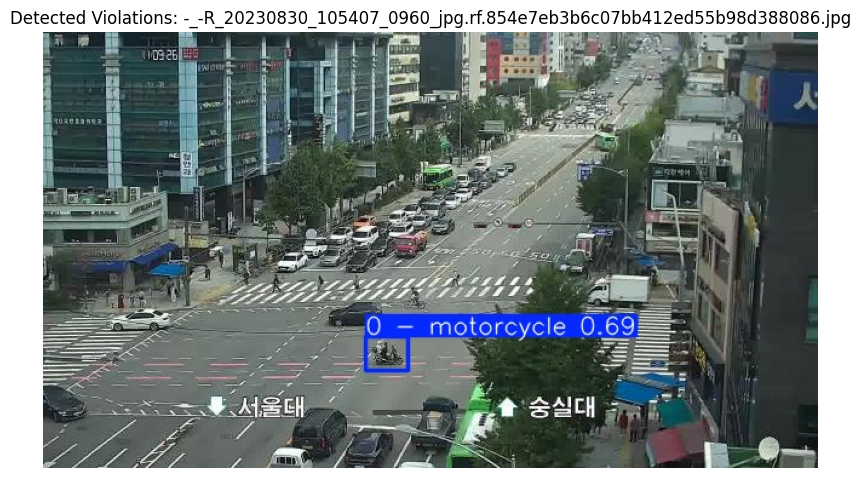

  5%|▌         | 1/20 [00:00<00:06,  3.03it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0502_jpg.rf.37fbe64654b4b8169e4ef7f1ec7bdc11.jpg: 384x640 1 0 - motorcycle, 13.9ms
Speed: 1.4ms preprocess, 13.9ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


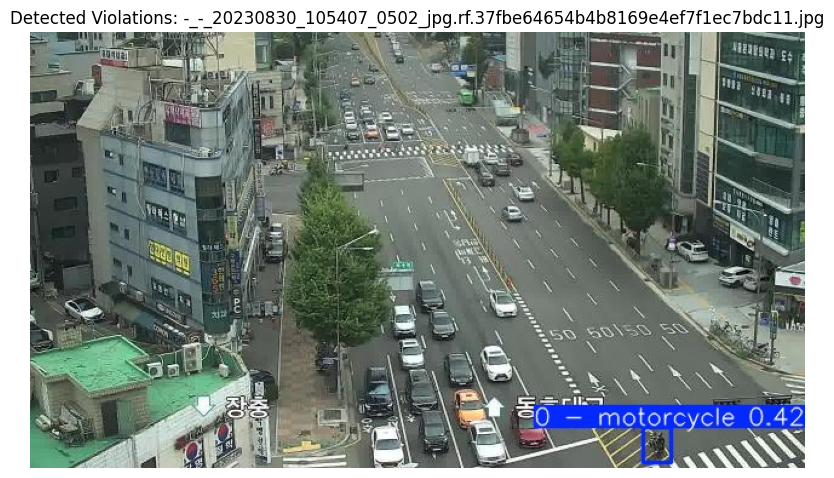

 10%|█         | 2/20 [00:00<00:05,  3.09it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0002_jpg.rf.d5638ea96546d840c5ed15ce7c76d34c.jpg: 384x640 1 5 - motorcycle - stop line, 16.0ms
Speed: 1.2ms preprocess, 16.0ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


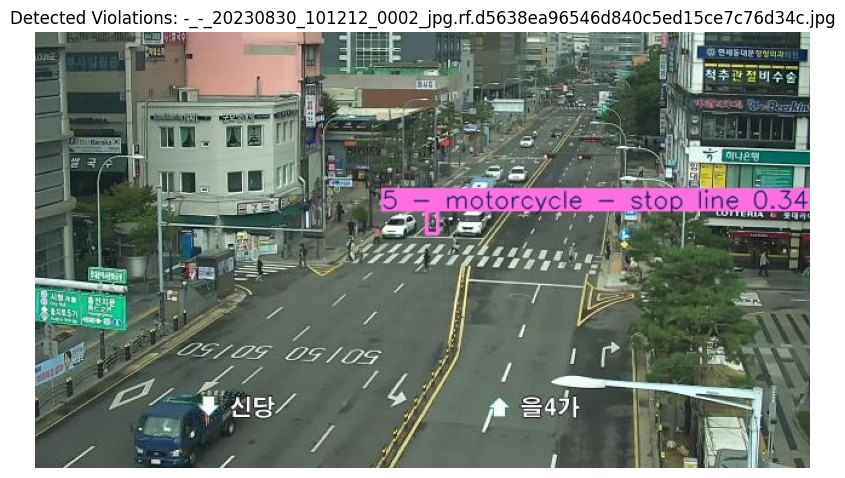

 15%|█▌        | 3/20 [00:00<00:05,  3.15it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0279_jpg.rf.2a5252b691a20600c797228ad2e34526.jpg: 384x640 2 0 - motorcycles, 14.8ms
Speed: 1.2ms preprocess, 14.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


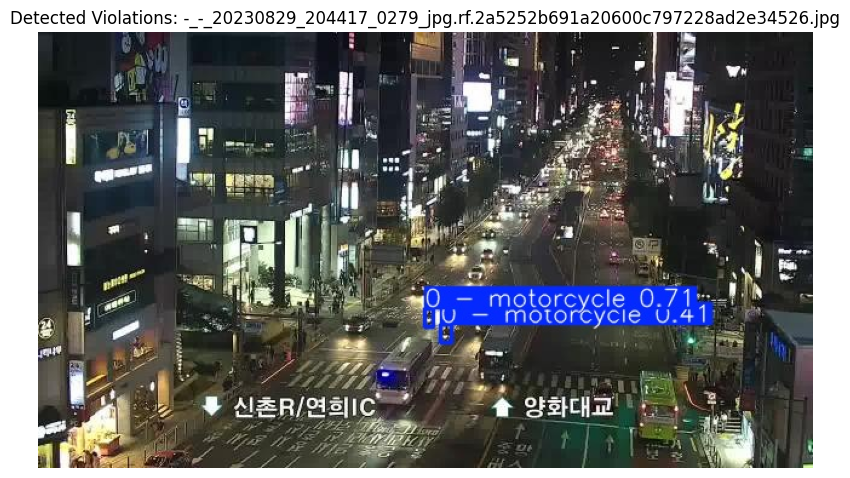

 20%|██        | 4/20 [00:01<00:05,  3.14it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0020_jpg.rf.7807e9643145b95a23d6dbec088d48d8.jpg: 384x640 2 0 - motorcycles, 17.8ms
Speed: 1.4ms preprocess, 17.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


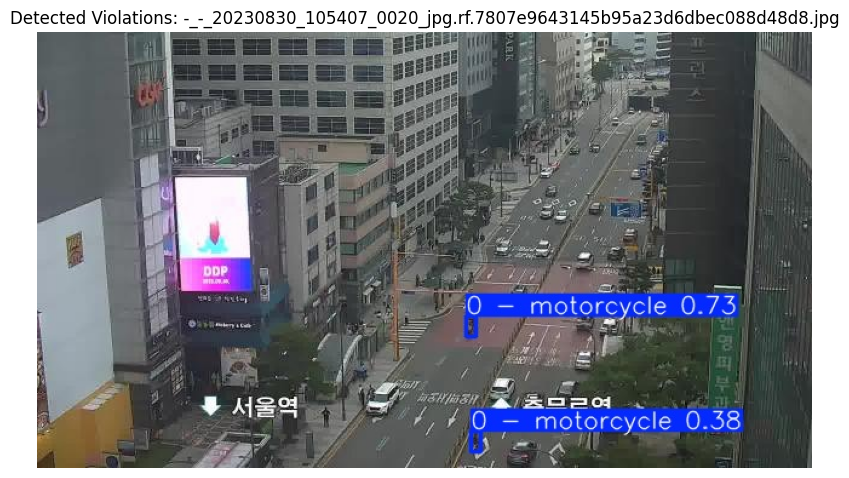

 25%|██▌       | 5/20 [00:01<00:04,  3.22it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0955_jpg.rf.145b252b4d140eb99e4f45fba456a61a.jpg: 384x640 1 0 - motorcycle, 13.7ms
Speed: 1.2ms preprocess, 13.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


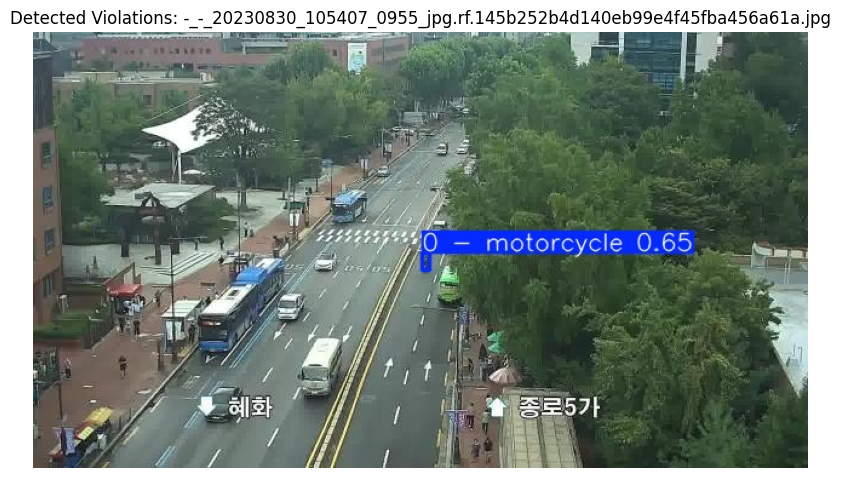

 30%|███       | 6/20 [00:01<00:04,  3.09it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0213_jpg.rf.21721ee99db2464b62b764772533beb0.jpg: 384x640 2 0 - motorcycles, 18.3ms
Speed: 1.4ms preprocess, 18.3ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


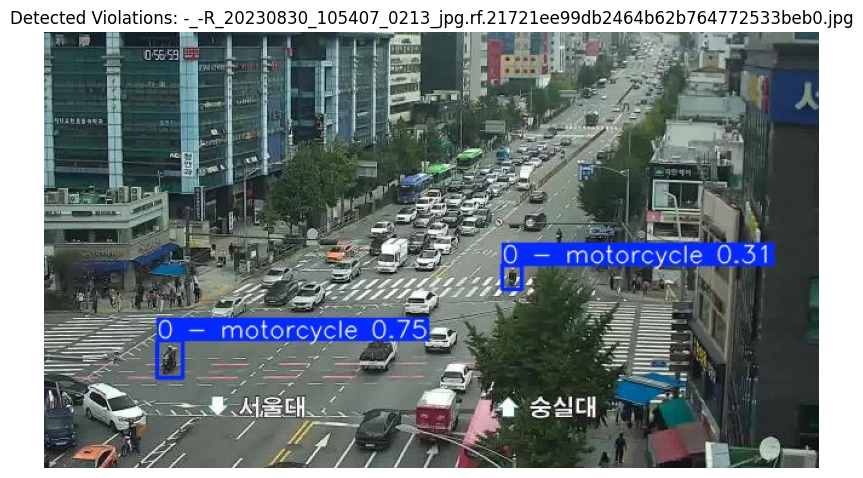

 35%|███▌      | 7/20 [00:02<00:04,  3.11it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0060_jpg.rf.f0e6b0a57ea51d9b77ca114a7f062a14.jpg: 384x640 3 0 - motorcycles, 17.3ms
Speed: 1.5ms preprocess, 17.3ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


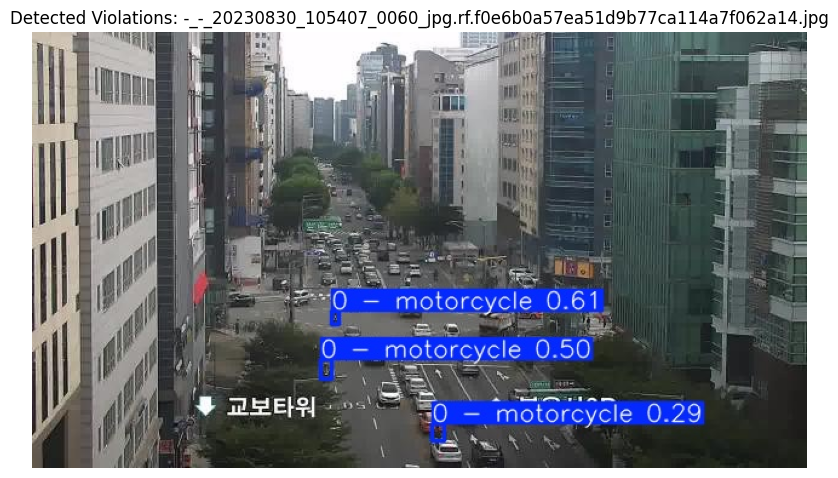

 40%|████      | 8/20 [00:02<00:03,  3.18it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0418_jpg.rf.672ea565dc1aae5c2a4c432744bd88e8.jpg: 384x640 3 5 - motorcycle - stop lines, 15.9ms
Speed: 1.3ms preprocess, 15.9ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


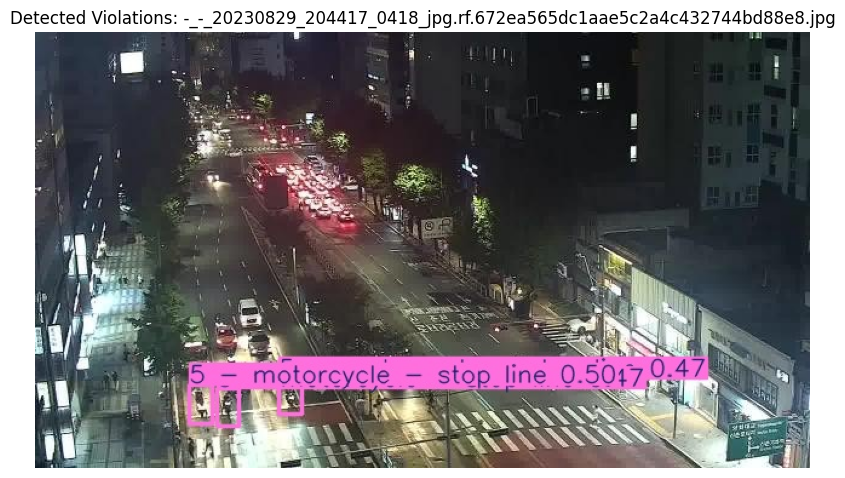

 45%|████▌     | 9/20 [00:02<00:03,  3.26it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0445_jpg.rf.6d29235fb36d09a1b74e8f9c17536470.jpg: 384x640 (no detections), 15.7ms
Speed: 1.2ms preprocess, 15.7ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


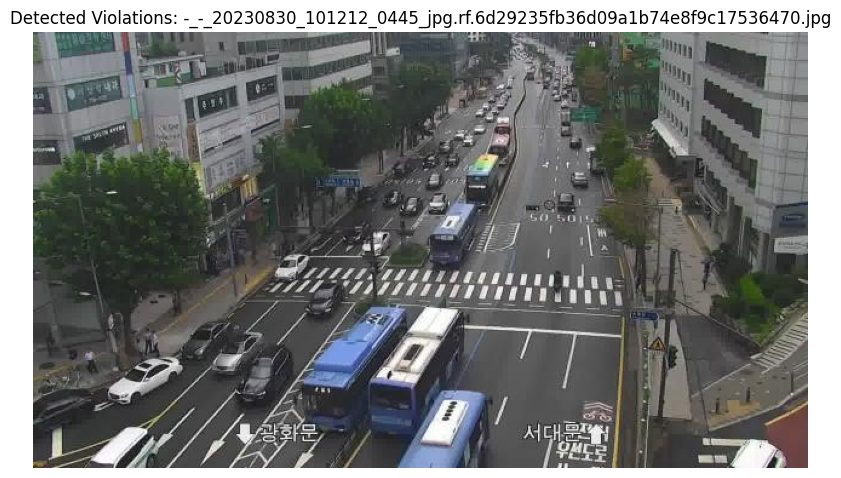

 50%|█████     | 10/20 [00:03<00:03,  3.27it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_1029_jpg.rf.d0b6eaa9520fd68744d2794bf304e8f7.jpg: 384x640 1 0 - motorcycle, 22.0ms
Speed: 1.2ms preprocess, 22.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


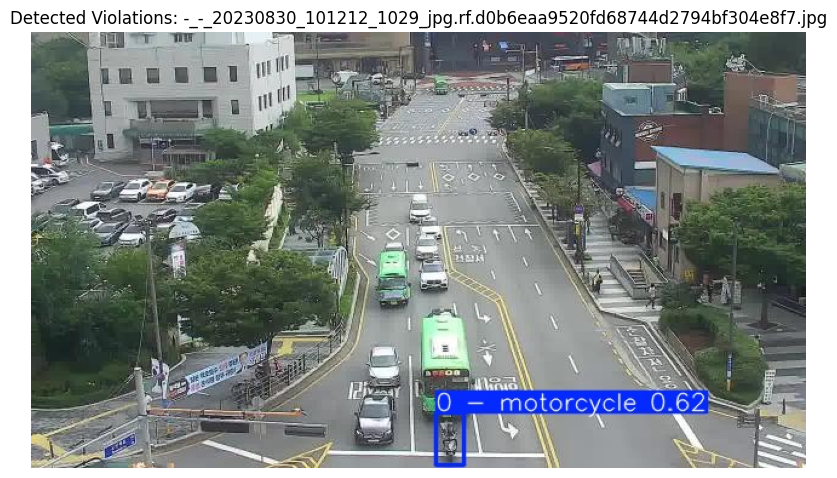

 55%|█████▌    | 11/20 [00:03<00:02,  3.18it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0982_jpg.rf.293e99391af5863c54ef4a23fd9d4eb4.jpg: 384x640 1 0 - motorcycle, 17.7ms
Speed: 1.6ms preprocess, 17.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


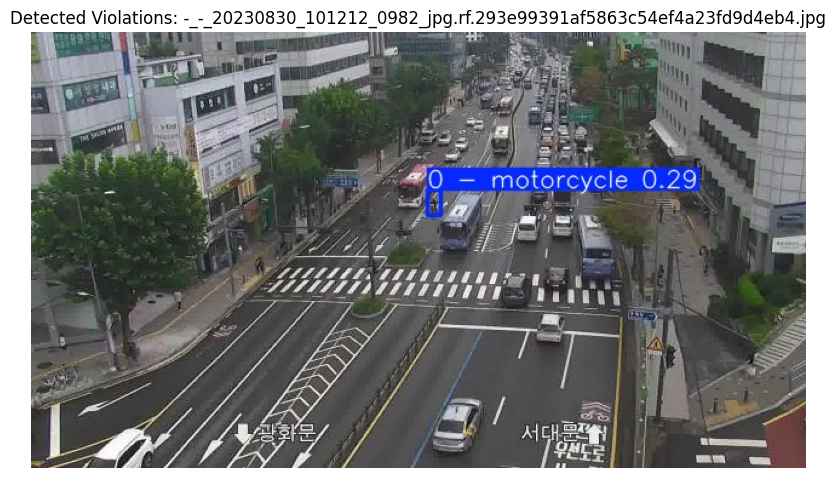

 60%|██████    | 12/20 [00:03<00:02,  3.18it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0545_jpg.rf.597abfbe163aac3b8bc0876a43502f29.jpg: 384x640 1 0 - motorcycle, 13.7ms
Speed: 1.1ms preprocess, 13.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


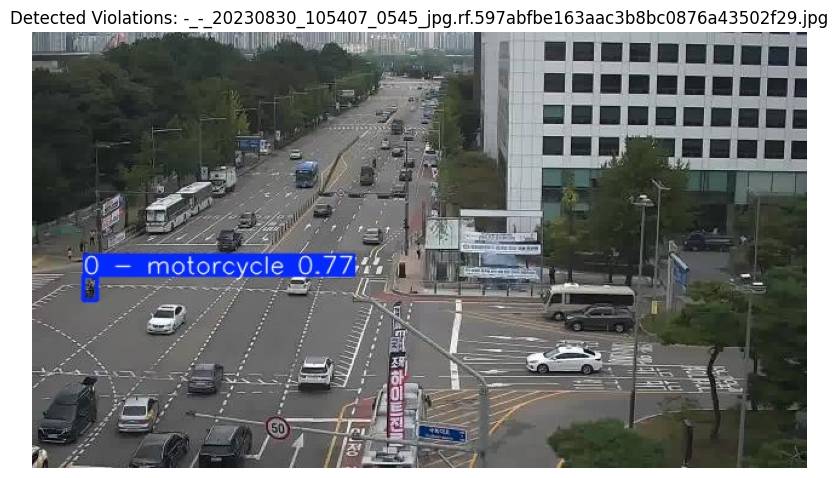

 65%|██████▌   | 13/20 [00:04<00:02,  3.23it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0057_jpg.rf.5bd366d28d69582689c1b6783627570d.jpg: 384x640 3 0 - motorcycles, 15.8ms
Speed: 1.2ms preprocess, 15.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


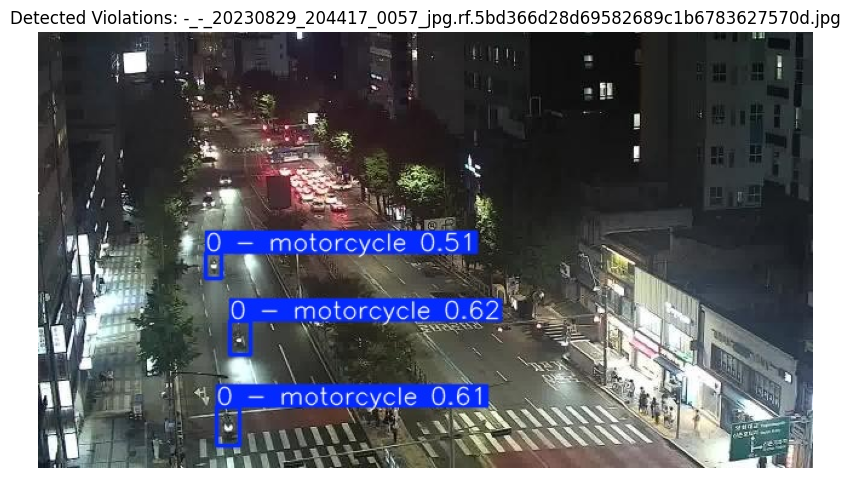

 70%|███████   | 14/20 [00:04<00:01,  3.27it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_101212_0935_jpg.rf.60e2d9327305b710a66d79fb18593b57.jpg: 384x640 1 0 - motorcycle, 15.6ms
Speed: 1.2ms preprocess, 15.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


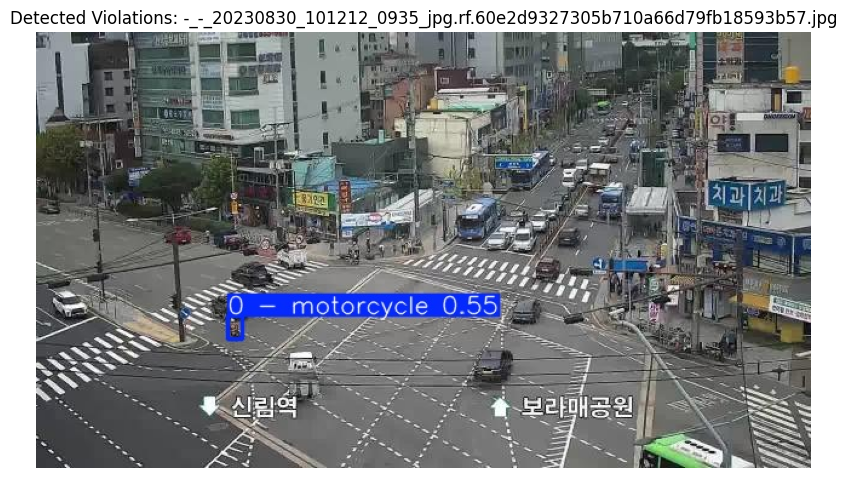

 75%|███████▌  | 15/20 [00:04<00:01,  3.27it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_1076_jpg.rf.27411389bedd72f2cc3839518ff994b4.jpg: 384x640 1 0 - motorcycle, 1 5 - motorcycle - stop line, 13.1ms
Speed: 1.2ms preprocess, 13.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


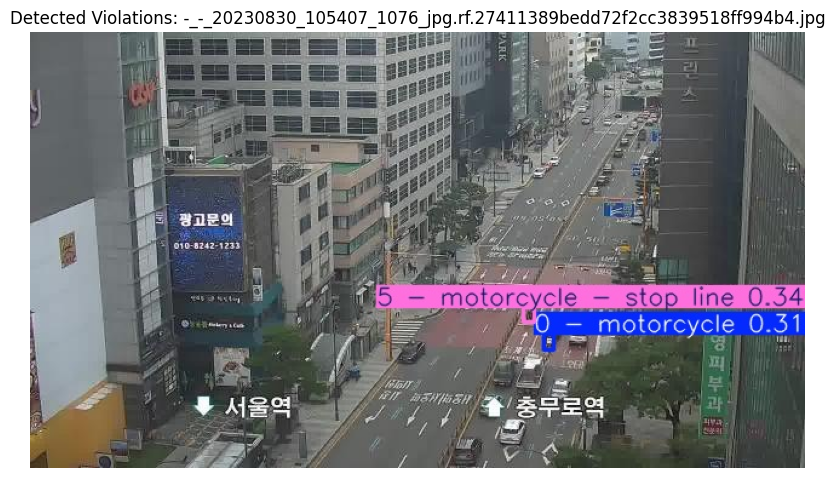

 80%|████████  | 16/20 [00:04<00:01,  3.32it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230829_204417_0445_jpg.rf.fb0b9854a685370600d2b4f2af38f396.jpg: 384x640 2 0 - motorcycles, 15.6ms
Speed: 1.2ms preprocess, 15.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


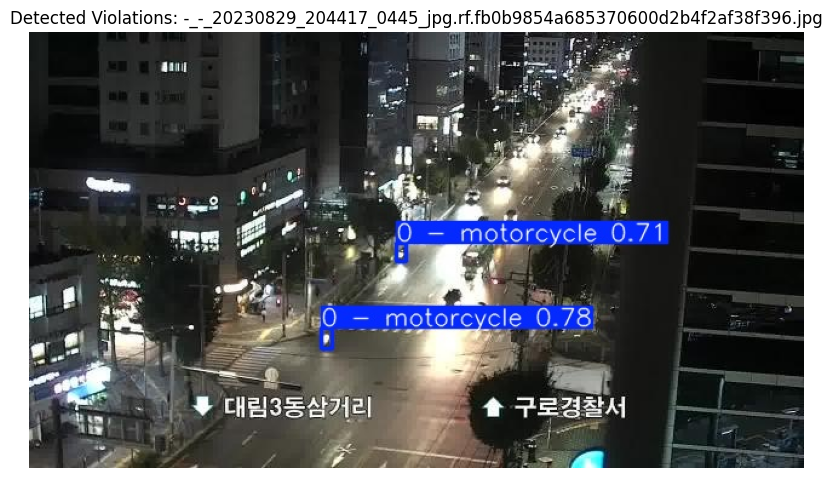

 85%|████████▌ | 17/20 [00:05<00:00,  3.42it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-R_20230830_105407_0376_jpg.rf.5ad10dec41df8eda748631e75368bdc2.jpg: 384x640 1 0 - motorcycle, 13.7ms
Speed: 1.2ms preprocess, 13.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


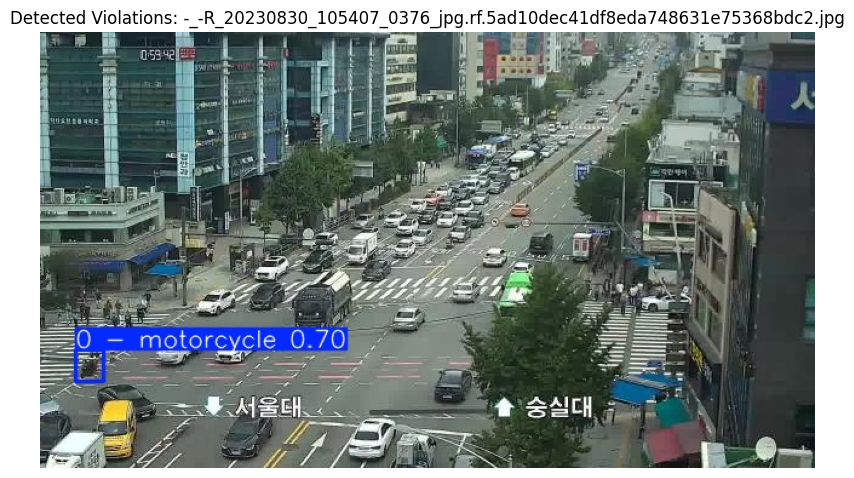

 90%|█████████ | 18/20 [00:05<00:00,  3.33it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-_20230830_105407_0064_jpg.rf.ed7ed98a3f05b8b7fd6e141dcbcd69b4.jpg: 384x640 1 0 - motorcycle, 18.1ms
Speed: 1.5ms preprocess, 18.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


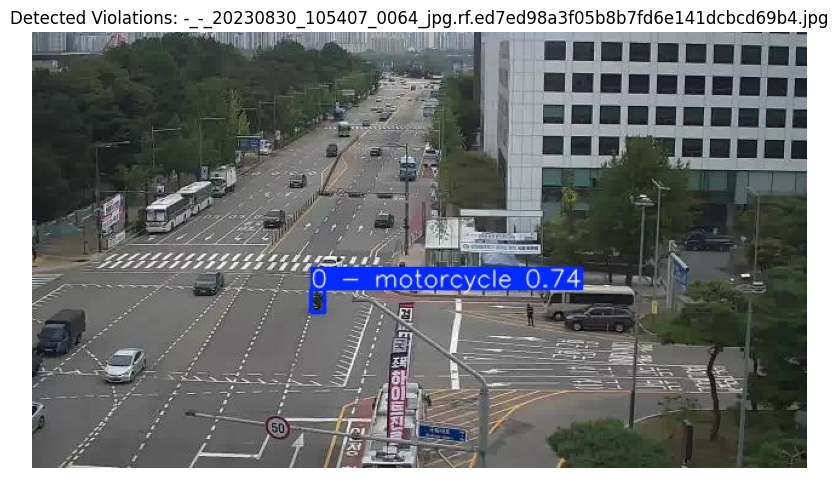

 95%|█████████▌| 19/20 [00:05<00:00,  3.34it/s]


image 1/1 /kaggle/working/Traffic-Violation-Detection-4/test/images/-_-4-_20230830_101212_0599_jpg.rf.6d4ec53864213ec3df866c2c564a0a60.jpg: 384x640 1 0 - motorcycle, 15.5ms
Speed: 1.2ms preprocess, 15.5ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


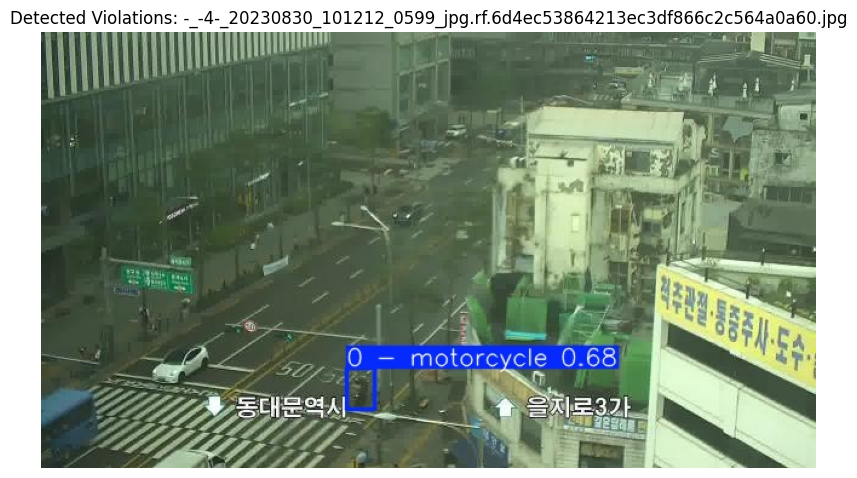

100%|██████████| 20/20 [00:06<00:00,  3.25it/s]


In [14]:
all_images = [img for img in os.listdir(input_folder) if img.endswith(('.jpg', '.png'))][:20]  # Limit to 20 images
for image_name in tqdm(all_images):
    img_path = os.path.join(input_folder, image_name)
    results = model(img_path)

    # Save with bounding boxes
    results[0].save(filename=os.path.join(output_folder, image_name))

    # Show output image with violations
    image_result = Image.open(os.path.join(output_folder, image_name))
    plt.figure(figsize=(10, 6))
    plt.imshow(image_result)
    plt.title(f"Detected Violations: {image_name}")
    plt.axis('off')
    plt.show()

In [15]:
sequence_data = []
labels = [] 

In [16]:
for image_name in os.listdir(output_folder):
    image_path = os.path.join(output_folder, image_name)
    result = model(image_path, verbose=False)[0]

    objects = result.boxes.cls.tolist() if result.boxes else []
    sequence = [0] * 10  # Assume 10 classes max; adjust as needed
    for obj in objects:
        idx = int(obj)
        if idx < len(sequence):
            sequence[idx] += 1
    
    sequence_data.append(sequence)
    labels.append(1 if 'violation' in image_name.lower() else 0)


In [17]:
X = np.array(sequence_data)
y = np.array(labels)

In [18]:
X = X.reshape((X.shape[0], 1, X.shape[1]))
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model_lstm = Sequential()
model_lstm.add(LSTM(64, input_shape=(1, X.shape[2])))
model_lstm.add(Dense(1, activation='sigmoid'))
model_lstm.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
model_lstm.fit(X_train, y_train, epochs=10, batch_size=8, validation_split=0.1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Epoch 1/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9721 - loss: 0.6677 - val_accuracy: 1.0000 - val_loss: 0.5784
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 1.0000 - loss: 0.5312 - val_accuracy: 1.0000 - val_loss: 0.4027
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 1.0000 - loss: 0.3469 - val_accuracy: 1.0000 - val_loss: 0.2304
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 1.0000 - loss: 0.1927 - val_accuracy: 1.0000 - val_loss: 0.1229
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 1.0000 - loss: 0.1035 - val_accuracy: 1.0000 - val_loss: 0.0696
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 1.0000 - loss: 0.0573 - val_accuracy: 1.0000 - val_loss: 0.0430
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 1.0000 - loss: 0.0368 - val_accuracy: 1.0000 - val_loss: 0.0287
Epoch 8/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 1.0000 - loss: 0.0255 - val_accuracy: 1.0000 - val_loss:

In [19]:
predictions = (model_lstm.predict(X_test) > 0.5).astype(int)

for i, pred in enumerate(predictions):
    if pred == 1:
        print(f"⚠️ Alert: Violation detected in test sample {i}")


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


In [20]:
def ocr_license_plate(filename, api_key):
    payload = {
        'isOverlayRequired': False,
        'apikey': api_key,
        'language': 'eng',
        'OCREngine': 2,
    }
    with open(filename, 'rb') as f:
        r = requests.post('https://api.ocr.space/parse/image',
                          files={filename: f}, data=payload)
        result = r.json()
        try:
            return result["ParsedResults"][0]["ParsedText"].strip()
        except:
            return ""

# Example:
# plate_number = ocr_license_plate("temp_plate.jpg", api_key=config("OCR_SPACE_API"))

print("✅ Notebook Complete. Ready for Detection + Alerts + OCR")


✅ Notebook Complete. Ready for Detection + Alerts + OCR


In [21]:
pdf = FPDF()
pdf.set_auto_page_break(auto=True, margin=15)
pdf.add_page()
pdf.set_font("Arial", size=12)
pdf.cell(200, 10, txt="Traffic Violation Alert Report", ln=True, align='C')
pdf.ln(10)

predictions = (model_lstm.predict(X_test) > 0.5).astype(int)
alert_count = 0

for i, pred in enumerate(predictions):
    if pred == 1:
        alert_count += 1
        alert_text = f"⚠️ Alert: Violation detected in test sample {i}"
        print(alert_text)
        pdf.cell(200, 10, txt=alert_text, ln=True)

pdf.cell(200, 10, txt=f"\nTotal Number of Violation Alerts: {alert_count}", ln=True)
pdf.output("violation_alert_report.pdf")

# --- 8. OCR (Optional License Plate) ---
def ocr_license_plate(filename, api_key):
    payload = {
        'isOverlayRequired': False,
        'apikey': api_key,
        'language': 'eng',
        'OCREngine': 2,
    }
    with open(filename, 'rb') as f:
        r = requests.post('https://api.ocr.space/parse/image',
                          files={filename: f}, data=payload)
        result = r.json()
        try:
            return result["ParsedResults"][0]["ParsedText"].strip()
        except:
            return ""

# Example:
# plate_number = ocr_license_plate("temp_plate.jpg", api_key=config("OCR_SPACE_API"))

print("✅ Notebook Complete. Ready for Detection + Alerts + PDF Report + OCR")


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
✅ Notebook Complete. Ready for Detection + Alerts + PDF Report + OCR


In [27]:
sequence_data = []
labels = []  # 1 = violation, 0 = normal
object_counts = []
filenames = []

for image_name in os.listdir(output_folder):
    image_path = os.path.join(output_folder, image_name)
    result = model(image_path, verbose=False)[0]

    objects = result.boxes.cls.tolist() if result.boxes else []
    sequence = [0] * 10  # Adjust class count if needed
    for obj in objects:
        idx = int(obj)
        if idx < len(sequence):
            sequence[idx] += 1

    if sum(sequence) == 0:
        continue

    sequence_data.append(sequence)
    object_counts.append(sum(sequence))
    labels.append(1 if sum(sequence) > 2 else 0)  # Violation if more than 2 objects
    filenames.append(image_name)

X = np.array(sequence_data)
y = np.array(labels)

if len(X) == 0:
    raise ValueError("No valid image detections to process. Ensure detection images have objects.")

# --- 6. Train LSTM for Alert Detection ---
X = X.reshape((X.shape[0], 1, X.shape[1]))
X_train, X_test, y_train, y_test, file_train, file_test, count_train, count_test = train_test_split(
    X, y, filenames, object_counts, test_size=0.2, random_state=42)

model_lstm = Sequential()
model_lstm.add(LSTM(64, input_shape=(1, X.shape[2])))
model_lstm.add(Dense(1, activation='sigmoid'))
model_lstm.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
model_lstm.fit(X_train, y_train, epochs=10, batch_size=8, validation_split=0.1)

# --- 7. Predict & Trigger Alerts and Save to PDF ---
pdf = FPDF()
pdf.set_auto_page_break(auto=True, margin=15)
pdf.add_page()
pdf.set_font("Arial", size=12)
pdf.cell(200, 10, txt="Traffic Violation Alert Report", ln=True, align='C')
pdf.ln(10)

predictions = (model_lstm.predict(X_test) > 0.5).astype(int)
alert_count = 0

for i, pred in enumerate(predictions):
    alert_text = f"Image: {file_test[i]} | Objects: {count_test[i]} | Violation: {'YES' if pred == 1 else 'NO'}"
    if pred == 1:
        alert_count += 1
        print("⚠️ Alert:", alert_text)
    pdf.cell(200, 10, txt=alert_text, ln=True)

pdf.ln(10)
pdf.cell(200, 10, txt=f"Total Number of Violation Alerts: {alert_count}", ln=True)
pdf.output("violation_alert_report2.pdf")

# --- 8. OCR (Optional License Plate) ---
def ocr_license_plate(filename, api_key):
    payload = {
        'isOverlayRequired': False,
        'apikey': api_key,
        'language': 'eng',
        'OCREngine': 2,
    }
    with open(filename, 'rb') as f:
        r = requests.post('https://api.ocr.space/parse/image',
                          files={filename: f}, data=payload)
        result = r.json()
        try:
            return result["ParsedResults"][0]["ParsedText"].strip()
        except:
            return ""

# Example:
# plate_number = ocr_license_plate("temp_plate.jpg", api_key=config("OCR_SPACE_API"))

print("✅ Notebook Complete. Detection + Alerts + Vehicle Count + PDF Report Ready!")


Epoch 1/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - accuracy: 0.7394 - loss: 0.6965 - val_accuracy: 0.4286 - val_loss: 0.6896
Epoch 2/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7752 - loss: 0.6698 - val_accuracy: 1.0000 - val_loss: 0.6655
Epoch 3/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9811 - loss: 0.6415 - val_accuracy: 1.0000 - val_loss: 0.6418
Epoch 4/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9811 - loss: 0.6180 - val_accuracy: 1.0000 - val_loss: 0.6175
Epoch 5/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9962 - loss: 0.5890 - val_accuracy: 1.0000 - val_loss: 0.5924
Epoch 6/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9942 - loss: 0.5652 - val_accuracy: 1.0000 - val_loss: 0.5679
Epoch 7/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9811 - loss: 0.5418 - val_accuracy: 1.0000 - val_loss: 0.5422
Epoch 8/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9942 - loss: 0.5112 - val_accuracy: 1.0000 - val_loss: 0.5138
Epoch 9